# From Inner Products to Interpolation and Image Processing - An Extensive Journey

## Introduction

In this project we will first lay some theoretical groundwork about the Fourier transform, and the discrete Fourier transform, the DFT. Problem 1 mainly consists of such problems, but we also acquaint ourselves with scipy's package for working with the DFT. In problem 2 we look into how translation, that is, shifting our functions by some amount, can be used to interpolate periodic functions. Having done this, we direct our attention to problem 3, in which we are introduced to the Dircihlet kernel, and learn more about how we can use it in order to for instance interpolate signals. Lastly, in problem 4, we will make an attempt to use the knowledge we have gained throughout the project in some application of the Fourier transform and interpolation in image processing.

In [1]:
import numpy as np
import scipy as sc 
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
plt.rcParams['figure.dpi'] = 300

## Task 1 - The (Discrete) Fourier Transform

### a) Orthogonality of Exponential Functions

Now we want to consider a function $e^{2\pi ikx}$, $k \in \mathbb{Z}, x \in \mathbb{T}$. Where $\mathbb{Z}$ denotes the integers, both positive and negative, and $\mathbb{T}$ represents the period of our function, $T \equiv [0, 1)$. Now we want to consider if two functions on this form, $e^{2\pi i k \cdot}$ and $e^{2\pi i h \cdot}$, are orthogonal to each other. It should also be mentioned that we use a "$\cdot$" to represent our unknown, so that it is clear in the latter that we do not evaluate for instance the inner product at a certain point $x$, but instead we evaluate the function itself. Here, for $k=h$, we get that 
$$
\langle e^{2\pi i k \cdot}, e^{2\pi i h \cdot} \rangle = \int_0^1e^{2\pi i(k-k)x }dx = \int_0^1 1 dx = 1
$$


Now we are going to look at the case where $k \neq h$:

$$
\langle e^{2\pi i k \cdot}, e^{2\pi i h \cdot}\rangle = \int_0^1 e^{2 \pi i (k-h) x } dx=\left[ \frac{1}{2\pi i (k-h)}e^{2\pi i (k-h) x} \right]_0^1 = \frac{1}{2\pi i (k-h)} (e^{2\pi i (k-h)}-1)=\frac{1}{2\pi i (k-h)} (1^{k-h}-1)=0
$$

Which together gives that 
$$
\langle e^{2 \pi i k\cdot}, e^{2\pi i h \cdot} \rangle = 
\begin{cases}
1 \quad \text{if } k =h \\
0 \quad \text{else}
\end{cases}
$$
Meaning that these functions are orthogonal to each other for different $k, h$.

### b) Orthogonality of Trigonometric Functions

Now we want to consider trigonometric functions, on the form $\sin(2\pi m x)$, $m \in \mathbb{N}$ and $\cos(2\pi n x)$, $n \in \mathbb{N}_0$. First we consider the orthogonality-relation between $\sin()$ and $\cos()$, before we look at the relation between $\sin()$-functions for different $n, m$, and lastly for $\cos()$-functions.

$$
\langle \sin(2\pi n \cdot), \cos(2\pi m \cdot)\rangle = \int_0^1\sin(2\pi n x) \overline{\cos(2\pi m x)} dx 
$$

Now, knowing that the functions in our integrand are odd, and even functions, the integrand is odd, and when you integrate an odd function over a period, which we are doing here, the resulting integral is zero, meaning that 

$$
\langle \sin(2\pi n \cdot), \cos(2\pi m \cdot)\rangle =0
$$

Meaning that these functions are orthogonal. 
Now, considering the $\sin()$-functions, first with $m=n$
$$
\langle \sqrt{2}\sin(2\pi n \cdot), \sqrt{2}\sin(2\pi m \cdot)\rangle = \int_0^1 2 \sin^2(2\pi nx)dx
$$
If we now use the identity 
$$
\cos(2x) = 1-\sin^2(x) \iff \sin^2(x) = \frac{1}{2}(1-\cos(2x))
$$
We get that the integral simplifies to 
$$
\frac{2}{2} \int_0^1(1-\cos(4\pi n x))dx = [x - \frac{1}{4\pi n} \sin(4 \pi n x)]_0^1 = 1
$$


$$
\langle \sqrt{2} \sin(2\pi n \cdot), \sqrt{2}  \sin(2\pi m \cdot)\rangle = 2 \int_0^1 \sin(2\pi n x) \sin(2\pi m x)dx = \frac{2}{2} \int_0^1 (\sin(2\pi (n+m) x ) + \sin(2\pi (n-m) x)) dx
$$
$$
=\left[- \frac{1}{2\pi(n+m)}\cos(2\pi (n+m) x) - \frac{1}{2\pi(n-m)}\cos(2\pi (n-m) x)\right]_0^1
$$
$$
=\left(- \frac{1}{2\pi(n+m)} - \frac{1}{2\pi(n-m)}\right) - \left(- \frac{1}{2\pi(n+m)} - \frac{1}{2\pi(n-m)}\right) = 0
$$

Where we have used the identity 
$$
\sin(a) + \sin(b) = \frac{1}{2} (\sin(a+b)+\sin(a-b))
$$

Together this yields that 
$$
\langle \sqrt{2} \sin(2\pi n\cdot), \sqrt{2} \sin(2\pi m\cdot) = \begin{cases}
0 \quad \text{if } m \neq n \\
1 \quad \text{if } m = n
\end{cases} 
$$
Meaning that for different integers $m$ and $n$, these $\sin()$-functions are orthogonal.

Now we can instead consider
$$
\langle \sqrt{2} \cos(2\pi n), \sqrt{2} \cos(2\pi m) = 2\int_0^1\cos(2\pi nx)\cos(2\pi mx) dx
$$
Using the trigonometric identity
$$
\cos(x)\cos(y) = \frac{1}{2}(\cos(x-y)+\cos(x+y))
$$
Meaning that the inner product can be written as 
$$
\frac{2}{2}\int_0^1 \left(\cos(2\pi x (m-n)) + \cos(2\pi x (m+n)) \right)dx
$$
Now, if we first assume that $m \neq n$ we can calculate the integral as
$$
\left[\frac{1}{2\pi(m-n)}\sin(2\pi x (m-n)) + \frac{1}{2\pi (m+n)}\sin(2\pi x(m+n))\right]_0^1 = 0
$$
And for the other case, where $m=n$, we get that the integral can be calculated as
$$
\int_0^1 \cos( 0) + \cos(4\pi x m)dx 
$$ 
And now, we can again split into two cases, $m=n \neq 0$ and $m=n=0$. For the first case we then have that the integral is
$$
1 + \frac{1}{4\pi m} \bigg[\sin(4\pi mx) \bigg]_0^1=1
$$
And lastly, if $m=n=0$, we have that 
$$
\int_0^1 ((\cos(0)+\cos(0)) dx = 2
$$
Which altogether gives the following relation

$$
\langle \sqrt{2} \cos(2\pi n \cdot), \sqrt{2} \cos(2\pi m \cdot) \rangle = \begin{cases}
0 \quad \text{if } m \neq n \\
1 \quad \text{if } m = n \neq 0 \\
2 \quad \text{if } m = n = 0
\end{cases}
$$

### c) Vector Spaces of Exponential and Trigonometric Functions
We now want to use the results from the previous tasks to describe the vector spaces defined as $ \mathcal{T}_n := \text{span} \{e^{-2\pi in \cdot}, \ldots, e^{2\pi in \cdot} \} $ and $ \mathcal{S}_n := \text{span} \{\cos(0\cdot), \cos(2\pi \cdot), \ldots, \cos(2 \pi n \cdot), \sin(2\pi \cdot), \sin(2\pi2 \cdot), \ldots, \sin(2 \pi n \cdot) \}  $. Based on the earlier tasks, we know that every element used to span $\mathcal{T}_n$ is orthogonal to each other and also normalized, since the inner product with itself is $1$, and zero with another element. Hence, the set $ \{e^{-2\pi in \cdot}, \ldots, e^{2\pi in \cdot} \} $ forms an orthonormal basis for $\mathcal{T}_n$.

When it comes to $\mathcal{S}_n$ we see that for almost every element we need the factor $ \sqrt{2} $ in front of the element to have normalized vectors. However, for $\cos(0\cdot)$ we still want a coefficient of $1$. So the orthonormal basis for $\mathcal{S}_n$ is the set 

$$
\text{span} \left\{\cos(0\cdot), \sqrt{2} \cos(2\pi \cdot), \ldots, \sqrt{2} \cos(2 \pi n \cdot), \sqrt{2} \sin(2\pi \cdot), \sqrt{2} \sin(2\pi2 \cdot), \ldots, \sqrt{2} \sin(2 \pi n \cdot) \right\} 
$$

The dimensions of the spaces correspond to the number of elements in each basis, so we know that 
$$
\underline{\dim (\mathcal{S}_n) = \dim (\mathcal{T}_n) = 2n+1}
$$

Now if we want to compare these spaces, we can for instance use Euler's formula,

$$
e^{ix}=\cos(x)+i\sin(x)
$$
Which gives the following complex representations of the $\cos()$ and $\sin()$ functions

$$
\sin(x) = \frac{e^{ix}-e^{-ix}}{2i}
$$
$$
\cos(x) = \frac{e^{ix}+e^{-ix}}{2}
$$
Now we want to see if every element $f\in \mathcal{S}_n$ is also an element in $\mathcal{T}_n$. Every element $f \in \mathcal{S_n}$ can be written as 
$$
f(x)=\frac{a_0}{2}+ \sum_{k=1}^na_k \cos(2\pi k x) + b_k \sin(2\pi kx) , \quad a_0, a_1, \ldots, a_n, b_1, \ldots, b_n \in \mathbb{R}
$$
Then by using the complex representations of the trigonometric functions we can rewrite $f$ as 
$$
f(x) = \frac{a_0}{2} + \sum_{k=1}^n a_k \frac{e^{2\pi i k x}+e^{2\pi i k x}}{2} -ib_k \frac{e^{2\pi i k x}-e^{2\pi i k x}}{2}
$$
$$
=\frac{a_0}{2} + \sum_{k=1}^n \frac{a_k-i b_k}{2}e^{2\pi i kx} + \frac{a_k+i b_k}{2}e^{-2\pi i kx}
$$
$$
=\sum_{k=-n}^n c_k e ^{2\pi i k}
$$
With 
$$
c_k = \begin{cases}
\frac{a_k-ib_k}{2} \quad & \text{if } k \geq 1 \\ 
\frac{a_{-k}+ib_{-k}}{2}  \quad &\text{if } k \leq -1 \\ 
\frac{a_0}{2} \quad & \text{if } k = 0 \\
\end{cases}
\qquad \Rightarrow \qquad c_k = \overline{c_{-k}} \in \mathbb{C}
$$
This means that every element in $\mathcal{S}_n$ is also an element in $\mathcal{T}_n$, and since they have the same dimension, they must be the same space $\square$. 

### d) Expressions for the Fourier Coefficients

Now we want to find expressions for the coefficients we introduced above. Here we can make use of our previous representation of a function $f \in \mathcal{S}_n$, which is 
$$
f(x)=\frac{a_0}{2}+ \sum_{k=1}^na_k \cos(2\pi k x) + b_k \sin(2\pi kx) , \quad a_0, a_1, .., a_n, b_1, ..., b_n \in \mathbb{R}
$$
Now, in order to determine the coefficients in the expression above, we can consider the inner product between our function $f$, and $2\cos(2\pi k\cdot)$. Since the inner product is linear in its first argument, we get that the first coefficient is 

$$
2\langle f, \cos(2\pi k \cdot) \rangle = \langle a_0,  \cos(2\pi k \cdot) \rangle + \sum_{j=1}^n a_j\langle \sqrt{2}\cos(2\pi j \cdot) , \sqrt{2}\cos(2\pi k \cdot) \rangle + \sum_{j=1}^n b_j\langle \sqrt{2}\sin(2\pi j \cdot) , \sqrt{2}\cos(2\pi k \cdot) \rangle
$$
Now, using our results from b), we can say that all inner products are zero, except the one where the functions are not orthogonal, $\langle \cos(2\pi k\cdot), \cos(2\pi k\cdot)\rangle$. This gives that 
$$
2\langle f, \cos(2\pi k \cdot) \rangle = a_k
$$

We can then calculate these with

$$
a_k =  2\int_{-\frac{1}{2}}^{\frac{1}{2}} f(x) \cos (2\pi k x) dx, \qquad k=0,1,\ldots, n \quad \square
$$

Similarly for the other case we then get that 
$$
2\langle f, \sin(2\pi k \cdot) \rangle = \left\langle a_0, \sin(2\pi k \cdot) \right\rangle +\sum_{j=1}^n a_j \left\langle \sqrt{2}\cos(2\pi j \cdot) , \sqrt{2}\sin(2\pi k \cdot) \right\rangle +\sum_{j=1}^n b_j \left\langle \sqrt{2}\sin(2\pi j \cdot) , \sqrt{2}\sin(2\pi k \cdot) \right\rangle 
$$

We have already computed these inner products, and get that they all are zero, except for $b_j$ when $j=k$

$$
2\langle f, \sin(2\pi k \cdot) \rangle = b_k 
$$
We can compute these by calculating 
$$
b_k = 2 \int_{-\frac{1}{2}}^{\frac{1}{2}} f(x) \sin(2\pi k x) dx, \qquad k=1,2,\ldots, n \quad \square
$$

### e) Approximating the Complex Fourier Coefficients with Composite Trapezoidal

The composite Trapezoidal rule states that for $N$ nodes, we have
$$
\int_a^b f(x)dx \approx \sum_{k=0}^{N-1} \frac{f_{k}+f_{k+1}}{2} \Delta x 
$$
We can use this to evaluate
$$
c_k = \int_{-\frac{1}{2}}^{\frac{1}{2}} f(x) e^{-2 \pi i k x} dx = \int_0^1 f(x) e^{-2 \pi i k x} dx 
$$

Our nodes are then $x_0, x_1, ..., x_{N-1}$ for $N \in \mathbb{N}$. We define our $x_j = \frac{j}{N}$, which means that $j = 0, 1, ..., N-1$, and then apply the Trapezoidal rule. Since our nodes are equispaced, we check $x_0$ and $x_1$ and get that $h = \frac{1}{N} - 0 = \frac{1}{N}$. Furthermore, since our function is periodic with period $T=1$, we know that $f(x_0) = f(x_N)$.


From the expression above we can then use the composite Trapeziodal rule to get that
$$
c_k \approx \hat{f}_k \coloneqq \sum_{j=0}^{N-1}\frac{g(x_j)+g(x_{j+1})}{2}h,  \quad g(x) = f(x)e^{-2\pi i kx}
$$

$$
=h\left(\frac{1}{2}g(x_0) + \sum_{j=1}^{N-1}g(x_k)+\frac{1}{2}g(x_N)\right)
$$
$$
=\frac{1}{N}\sum_{j=0}^{N-1}g(x_k)=\frac{1}{N}\sum_{j=0}^{N-1}f_j e^{\frac{-2\pi i k j}{N}}
$$

Now, if we were to examine the term $c_{k+N}$, we can use the fact that our function $f$ is $1$-periodic, we have
$$
\hat{f}_{k+N} = \frac{1}{N}\sum_{j=0}^{N-1}f_j e^{\frac{-2\pi j (k+N)}{N}} = \frac{1}{N}\sum_{j=0}^{N-1}f_j e^{\frac{-2\pi j k}{N}}e^{-2\pi i j} = \frac{1}{N}\sum_{j=0}^{N-1}f_j e^{\frac{-2\pi j k}{N}} =\hat{f}_{k} 
$$
Meaning that the $\hat{f}_k$ are $N$ periodic. The approximation $c_k(f)\approx \hat{f}_k$ could be problematic when $|k|$ is greater than $N$, because the $\hat{f}_k$ are N-periodic while the $c_k$ are not. This means that $c_k$ values outside of our $N$ coefficients would be included as $\hat{f}_{k(\text{mod}N)}$. When $N$ is sufficiently large, $c_k(f)$ and $\hat{f}_k$ are equal, but this is not the case in general.

Collecting these coefficients into a vector $\hat{\textbf{f}} = (\hat{f}_0, ... , \hat{f}_{N-1})^T$, we get the Discrete Fourier Transform, which we will work more with later. 

### f) Interlude: Sums of Exponentials

Now we are interested in evaluating the sum 
$$
\frac{1}{N} \sum_{j=0}^{N-1} e^{-\frac{2\pi i j k}{N}}
$$
Which is very similar to our previous expression for the discrete Fourier transforms, but now without the function values $f_j$. 

We see that we can evaluate this as a geometric power series, so we use the formula for the partial sum:
$$
\sum_{i=0}^n a r^i= a \frac{r^{n+1}-1}{r-1}, \qquad r\neq 1
$$
This gives
$$
\sum_{j=0}^{N-1}(e^{-2\pi i k/N})^j=\frac{e^{-2\pi i k}-1}{e^{-2\pi i k/N}-1}=\frac{1-1}{e^{-2\pi i k/N}-1}=0
$$

Which holds for all $k \in \mathbb{Z}$ where $k \not\equiv 0 \quad (\text{mod }N)$, as we then have $r=e^{-2\pi i k/N}\neq 1$, and we avoid division by zero. We then need to investigate what happens when $k \equiv 0 \quad (\text{mod }N)$. In this case we have that 
$$
\frac{1}{N} \sum_{j=0}^{N-1} e^{-2\pi i j l}, \quad l \in \mathbb{Z}
$$

Now, from Euler's formula once again, we can say that $e^{-2\pi j l}=1$, since both $j$ and $l$ are integers. The sum is therefore
$$
\frac{1}{N} \sum_{j=0}^{N-1} 1 = 1
$$

Giving the final result, which will be useful for the rest of the project as well.

$$
\frac{1}{N}\sum_{j=0}^{N-1}e^{-2\pi i j k/N} =
\begin{cases}
1, \qquad & k \equiv 0  \quad (\text{mod } N) \\
0, \qquad & \text{else}
\end{cases} \quad \square
$$

### g) Matrix Representation of the Discrete Fourier Transform

Now, in order to work more with the Discrete Fourier Transform, we first want to represent it as a matrix, that is
$$
\hat{\textbf{f}}=\mathcal{F}_N \textbf{f}
$$
Where this matrix is given as 
$$
\mathcal{F}_N = \frac{1}{N}(e^{-\frac{2\pi i k l}{N}})_{k, l = 0}^N 
$$
If we let $w^{kl} = (e^{-2\pi i/N})^{kl}$
$$
\mathcal{F}_N = \frac{1}{N}
\begin{bmatrix}
1 & 1 & 1 & \ldots & 1 \\[6pt]
1 & w & w^2 & \ldots & w^{N-1} \\[6pt]
1 & w^2 & w^4 & \ldots & w^{2(N-1)} \\[6pt]
\vdots & \vdots & \vdots & \vdots & \vdots\\[6pt]
1 & w^{N-1} & w^{2(N-1)} & \ldots & w^{(N-1)^2}\\[6pt]
\end{bmatrix}
$$

We note that $\mathcal{F}_N$ = $\mathcal{F}_N^\top$

Here we see that each element is closely related to the terms in the sum we evaluated in the last subtask. Before we get to make use of this fact however, we can, for a vector $\textbf{a} = (a_0, ..., a_{N-1})^T$, introduce the circulant matrix 
$$
\text{circ } \textbf{a} =(a_{k-l \text{ mod N}})_{k, l = 0}^N = \begin{bmatrix}
a_0 & a_{N-1} & \ldots & a_2 & a_1 \\
a_1 & a_0 & \ldots & a_3 & a_2 \\
\vdots & & \ddots & & \vdots \\
a_{N-1} & a_{N-2} & \ldots & a_1 & a_0 
\end{bmatrix}
$$


Now, we want to show that our Fourier matrix, $\mathcal{F}_N$, diagonalizes the circulant matrix, which means that we can write 

$$
\text{circ }\textbf{a} = N^2 \overline{\mathcal{F_N}}\text{diag}(\hat{\textbf{a}})\mathcal{F}_N
$$

We first calculate $\hat{\mathbf{a}} =\mathcal{F}_N \mathbf{a} $:

$$
\hat{\mathbf{a}}=
\frac{1}{N}
\begin{bmatrix}
1 & 1 & 1 & \ldots & 1 \\[6pt]
1 & w & w^2 & \ldots & w^{N-1} \\[6pt]
1 & w^2 & w^4 & \ldots & w^{2(N-1)} \\[6pt]
\vdots & \vdots & \vdots & \vdots & \vdots\\[6pt]
1 & w^{N-1} & w^{2(N-1)} & \ldots & w^{(N-1)^2}\\[6pt]
\end{bmatrix}
\begin{bmatrix}
a_0 \\[6pt]
a_1 \\[6pt]
a_2 \\[6pt]
\vdots \\[6pt]
a_{N-1} \\[6pt]
\end{bmatrix}
=
\frac{1}{N}
\begin{bmatrix}
\sum_{i=0}^{N-1} a_i w^{0\cdot i} \\[6pt]
\sum_{i=0}^{N-1} a_i w^{1i}  \\[6pt]
\sum_{i=0}^{N-1} a_i w^{2i} \\[6pt]
\vdots \\[6pt]
\sum_{i=0}^{N-1} a_i w^{(N-1) i} \\[6pt]
\end{bmatrix}
$$
So the $j$-th element of $\hat{\mathbf{a}}$ is
$$
\hat{a}_j = \frac{1}{N} \sum_{i=0}^{N-1} a_i w^{j i} 
$$

We now let $\text{diag}(\hat{\mathbf{a}})$ be the $N \times N$ diagonal matrix with $\text{diag}(\hat{\mathbf{a}})_{jj}=\hat{a}_j$.
In order to to compute $N^2 \mathcal{F}_N^* \text{diag}(\hat{\mathbf{a}}) \mathcal{F}_N = N^2 \overline{\mathcal{F}_N} \text{diag}(\hat{\mathbf{a}}) \mathcal{F}_N$, we want to check that $N \mathcal{F}_N$ diagonalizes $\text{circ }\textbf{a}$

$$
A=N^2 \overline{\mathcal{F}_N} \text{diag}(\hat{\mathbf{a}}) \mathcal{F}_N = 
$$

$$
\overline{
\begin{bmatrix}
1 & 1 & 1 & \ldots & 1 \\[6pt]
1 & w & w^2 & \ldots & w^{N-1} \\[6pt]
1 & w^2 & w^4 & \ldots & w^{2(N-1)} \\[6pt]
\vdots & \vdots & \vdots & \vdots & \vdots\\[6pt]
1 & w^{N-1} & w^{2(N-1)} & \ldots & w^{(N-1)^2}\\[6pt]
\end{bmatrix}}
\begin{bmatrix}
\hat{a}_0 & 0 & 0 & \ldots & 0 \\[6pt]
0 & \hat{a}_1 & 0 & \ldots & 0 \\[6pt]
0 & 0 & \hat{a}_2 & \ldots & 0 \\[6pt]
\vdots & \vdots & \vdots & \vdots & \vdots\\[6pt]
0 & 0 & 0 & \ldots & \hat{a}_{N-1}\\[6pt]
\end{bmatrix}
\begin{bmatrix}
1 & 1 & 1 & \ldots & 1 \\[6pt]
1 & w & w^2 & \ldots & w^{N-1} \\[6pt]
1 & w^2 & w^4 & \ldots & w^{2(N-1)} \\[6pt]
\vdots & \vdots & \vdots & \vdots & \vdots\\[6pt]
1 & w^{N-1} & w^{2(N-1)} & \ldots & w^{(N-1)^2}\\[6pt]
\end{bmatrix}
$$


We can write the $k$-th row of the first matrix multiplication, $N\overline{\mathcal{F}_N} \text{diag}(\hat{\textbf{a}})$ as
$$
\begin{bmatrix}
\hat{a}_0 & \quad \overline{w^k} \hat{a}_1 & \overline{w^{2k}} \hat{a}_2 & \ldots & \overline{w^{(N-1)k}}\hat{a}_{N-1}
\end{bmatrix}
$$

We then multiply with the $l$-th column of $N\mathcal{F}_N$ and we get
$$
A_{k,l} = 
\hat{a}_0+w^l \overline{w^k} \hat{a}_1 + w^{2l} \overline{w^{2k}} \hat{a}_2 + \ldots + 
w^{(N-1)l} \overline{w^{(N-1)k}}\hat{a}_{N-1}
= 
\sum_{j=0}^{N-1}\hat{a}_j (w^l \overline{w^k})^j
$$

Plugging in $\hat{a}_j = \frac{1}{N} \sum_{p=0}^{N-1} a_p w^{j p}$ yields

$$
A_{k,l}
=
\frac{1}{N} \sum_{j=0}^{N-1} \sum_{p=0}^{N-1} a_p w^{jp} (w^l \overline{w^k})^j 
$$

Finally, substituting back $w = e^{-2\pi i /N}$


$$
A_{k,l}
=
\frac{1}{N} \sum_{j=0}^{N-1} \sum_{p=0}^{N-1} a_p e^{-2\pi i j (p+ l-k) /N} 
=
\frac{1}{N} \sum_{p=0}^{N-1} a_p \sum_{j=0}^{N-1} e^{-2\pi i j (p+ l-k) /N} 
$$


Where, with $n := p+l-k$, we get that the element above is equal to
$$
= \sum_{p=0}^{N-1}a_p\frac{1}{N}\sum_{j=0}^{N-1}\exp \frac{-2\pi i j n}{N}
$$
Now, we have already evaluated the factor after $a_p$, meaning that this sum is only $1$, and $0$ otherwise, when $n \equiv 0 (\text{mod}N)$, but this must again mean that $p+l-k \equiv 0 (\text{mod}N)$, meaning that $p \equiv k-l(\text{mod}N)$. Thus the only term that survives is
$$
a_{k-l\text{mod}N}
$$
This we recognize as an element of the circular matrix of $\textbf{a}$, and the proof is complete. $\square$

We are also interested in an expression for the inverse of our Fourier matrix, and here we can use the fact that $\text{circ}(\textbf{a})$ is diagonalizable, meaning that 

$$
\underline{(\mathcal{F}_N)^{-1} = N \overline{\mathcal{F}_N}}
$$

This can also be seen from the fact that 
$$
(AB)_{kl} = \sum_{j=0}^{N-1}A_{kj}B_{jl}
$$
Which gives that 
$$
(N\overline{\mathcal{F}_N}\mathcal{F}_N)_{kl} = N\frac{1}{N^2}\sum_{j=0}^{N-1}e^{\frac{2\pi i jk}{N}}e^{\frac{-2\pi i jl}{N}} = \frac{1}{N}\sum_{j=0}^{N-1}e^{\frac{2\pi i j(k-l)}{N}}
$$
We have examined this sum a couple of times before, which gives the cases 
$$
(N\overline{\mathcal{F}_N}\mathcal{F}_N)_{kl} = \begin{cases}
1, \quad l-k \equiv 0 (\text{mod}N)\\
0, \quad \text{else}
\end{cases}
$$
Now, since $0 \leq l, k < N$, we know that the only element different from zero is whenever $l=k$, meaning that $N\overline{\mathcal{F}_N}\mathcal{F}_N=I$, and we have confirmed our previous proposition for the inverse. 

### 1h) Use of the DFT
In order to work more efficiently with the DFT later, we will of course make great use of scipy's FFT package, but we will below also implement a Python function, ```transform(f, N, start = 0.0, n=None)```. This function's purpose is to make sampling of a function easier.

In [2]:
def transform(f, N, start = 0.0, n=None):
    """
    Function that calculates the function values in our N sample points, beginning at "start"
    Input: 
        f:     function
        N:     int, number of sample points
        start: float, optional parameter that indicates the start of our sample points
        n:     int, used for the Dirichlet kernel in task 3
    Output: 
        x:     (N) array of sample points
        fvals: (N) array of function values of the desired function
    """
    x = np.linspace(start, start+1, N, endpoint = False)

    if n == None:
        fvals = f(x)
    else:
        fvals = f(x, n)
    return x, fvals

Now we want to consider how this sampling function works on some functions, and consider qualitatively how many sampling points we need to get good reconstructions. We will also plot the calulated discrete Fourier coefficients, in order to acquaint ourselves further with these.

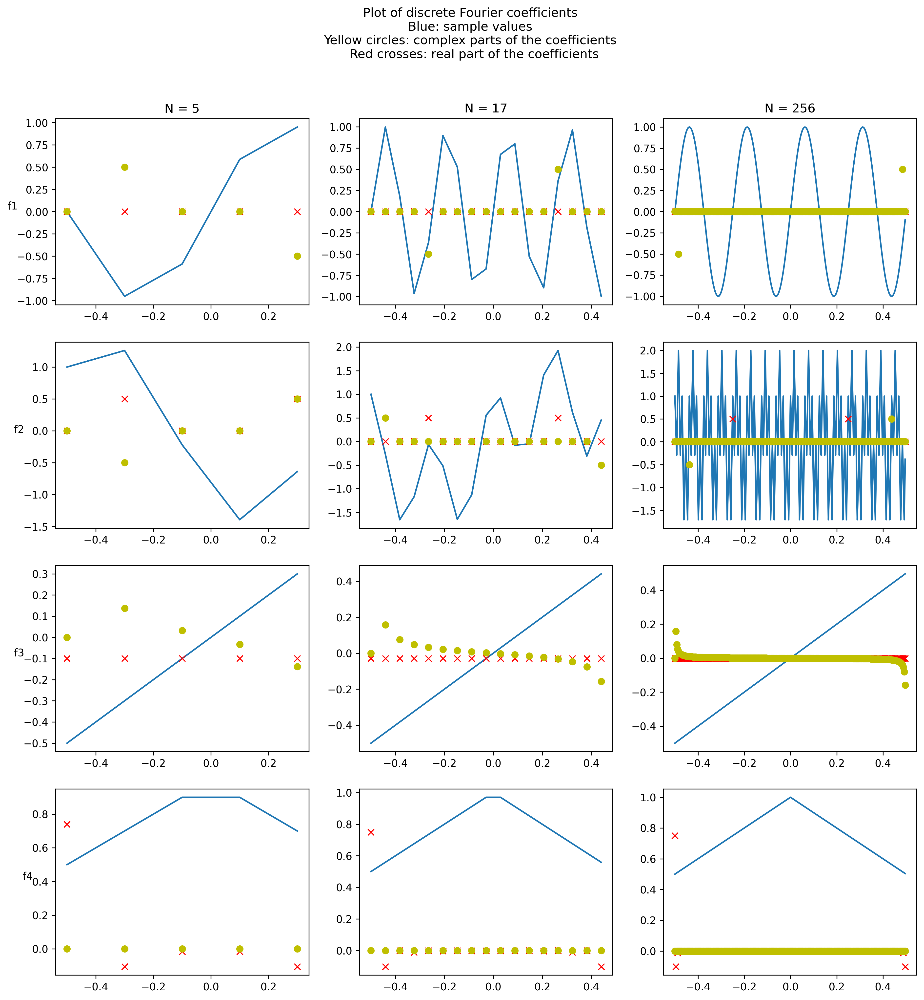

In [37]:
def f1(x):
    return np.sin(8*np.pi*x)

def f2(x):
    return np.sin(32*np.pi*x)+np.cos(128*np.pi*x)

def f3(x):
    return x

def f4(x):
    return 1-np.abs(x)

funcs = [f1, f2, f3, f4]
Ns = [5, 17, 256]
interval_start = -0.5 

num_of_funcs = len(funcs)
num_of_Ns = len(Ns)

fig, axs = plt.subplots(num_of_funcs,num_of_Ns, figsize = (15, 15))

fig.suptitle("Plot of discrete Fourier coefficients \nBlue: sample values \nYellow circles: complex parts of the coefficients \n Red crosses: real part of the coefficients")

for count in range(num_of_Ns):
    axs[0, count].set_title("N = " + str(Ns[count]))

for count in range(num_of_funcs):
    for N in range(num_of_Ns):
        x, f = transform(funcs[count], Ns[N], interval_start)
        f_hat = sc.fft.fft(f, norm="forward") #Calculates the DFT, and normalizes
        #with the keyword norm=forward
        axs[count, N].plot(x, f)
        axs[count, N].plot(x, np.real(f_hat), "x", color = "r")
        axs[count, N].plot(x, np.imag(f_hat), "o", color = "y")
    axs[count, 0].set_ylabel(str(funcs[count].__name__), rotation = 1)

fig.show()


Here we see that the linear function $f_3$ is approximated well by a low number of points, giving a straight line for $N$ as low as $7$. For $f_4$, we see that some more points are needed in order to get a good approximation. 

The two trigonometric functions however seem to be the two that need the most points to be approximated well. Here, $f_1$, which only consists of a $\sin$ term, gets a shape that is similar to the shape it is supposed to have, for $N=17$, although it is of course is a bit rough around the edges. $N=17$ does not seem to do $f_2$ any justice, and a higher number of sample points is required in order to get a decent approximation. Using the Nyquist formula we find that the lower bound for the number of samples in $f_1$ is $8$ and for $f_2$ we get $128$. To prevent aliasing we then need to choose a sample rate, $N$, above the Nyquist frequency.

### 1i) Calculating some Fourier Coefficents and Shuffling Others

Now, we are interested in studying the function $f_2$ a bit further. We first want to determine the real Fourier coefficients, $a_k(f_2)$ and $b_k(f_2)$. They are previously defined, so we can now calculate 

$$
a_k(f_2) = 2\langle \sin(32\pi \cdot)+\cos(128\pi \cdot), \cos(2\pi k \cdot)\rangle
$$

Using the linearity of the inner product, and the fact that we have evaluated inner products of trigonometric functions in 1b), we get that 

$$
a_k(f_2) = 2\langle \sin(32\pi \cdot), \cos(2\pi k \cdot)\rangle 
+ 2\langle \cos(128\pi \cdot), \cos(2\pi k \cdot)\rangle
= 2\langle \cos(128\pi \cdot), \cos(2\pi k \cdot)\rangle
$$

$$
a_k(f_2) = \begin{cases}
1, \quad k = 64\\
0, \quad \text{else}
\end{cases}
$$

Analogously for the other coefficients, we get that

$$
b_k(f_2) = 2\langle \sin(32\pi \cdot)+\cos(128\pi \cdot), \sin(2\pi k \cdot)\rangle
= 2\langle \sin(32\pi \cdot), \sin(2\pi k \cdot)\rangle
+ 2\langle \cos(128\pi \cdot), \sin(2\pi k \cdot)\rangle
= 2\langle \sin(32\pi \cdot), \sin(2\pi k \cdot)\rangle
$$

$$
b_k(f_2) = \begin{cases}
1, \quad k = 16\\
0, \quad \text{else}
\end{cases}
$$

Now, we can also do this for our complex coefficients, but we will rather use the previously derived relation between the real and the complex coefficients 

$$
c_k = \begin{cases}
\frac{a_k-ib_k}{2} \quad &  k \geq 1 \\ 
\frac{a_{-k}+ib_{-k}}{2}  \quad & k \leq -1 \\ 
\frac{a_0}{2} \quad &  k = 0 \\
\end{cases}
$$

So since we know that only $a_{64}(f_2)$ and $b_{16}(f_2)$ are equal to one, we know that we will only get contributions for $k=16$ and $k=64$, and because we also have that these coefficients are conjugate symmetric, $c_k = \overline{c_{-k}}$, we get that

$$
c_k=
\begin{cases}
\mp \frac{i}{2}, &\quad k= \pm 16 \\
\frac{1}{2}, &\quad k=\pm 64 \\
0, &\quad \text{else}
\end{cases}
$$

Now, in order to be able to work more with these coefficients, or more specifically the DFTs, we can again turn to scipy.fft. However, in order to make this work with our established system for indices, we would need to process these values a bit more, and here the scipy.fft.fftshift-function makes its apperance. This function shuffles our values, so that their indices match our system for thinking of them. 

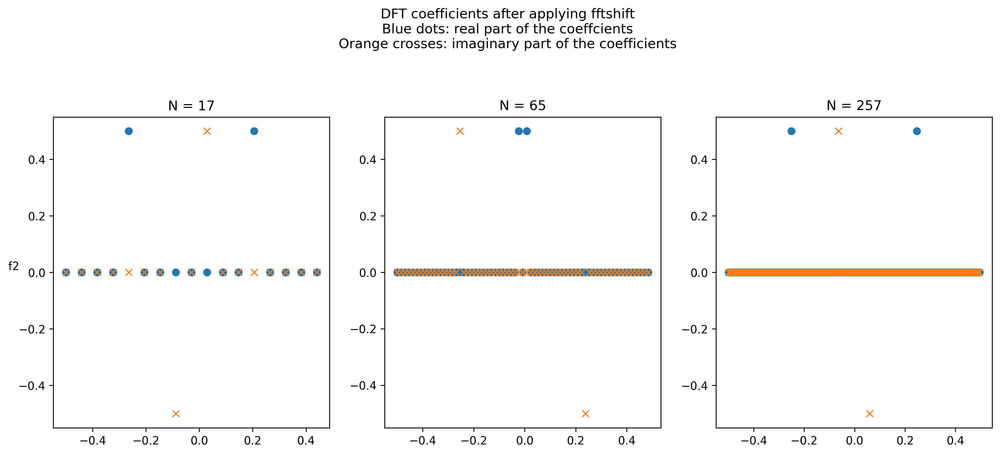

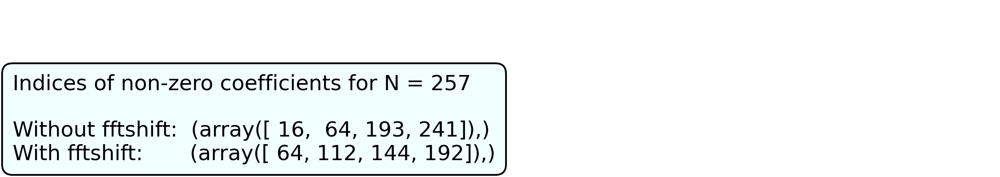

In [41]:
Ns = [17, 65, 257]

fig, axs = plt.subplots(1,3, figsize = (15, 5))
num_of_Ns = len(Ns)

fig.suptitle("DFT coefficients after applying fftshift\nBlue dots: real part of the coeffcients\nOrange crosses: imaginary part of the coefficients", y=1.15)

axs[0].set_ylabel("f2", rotation=1)

for N in range(num_of_Ns):
    axs[N].set_title("N = " + str(Ns[N]))
    x, f = transform(f2, Ns[N], interval_start)
    f_hat = sc.fft.fft(f, norm="forward")
    if N == 2:
        text1 = "Without fftshift:  " + str(np.where(np.abs(f_hat)>1e-3))
    f_hat = sc.fft.fftshift(f_hat)
    if N == 2:
        text2 = "With fftshift:       " + str(np.where(np.abs(f_hat)>1e-3))
    
    axs[N].plot(x, np.real(f_hat), "o")
    axs[N].plot(x, np.imag(f_hat), "x")
fig.show()

plt.figure(figsize=(8,1.5))
plt.text(0, 0, "Indices of non-zero coefficients for N = 257\n\n" + text1 + "\n" + text2, size=12, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()


scipy.fft.fft gives the output of the Fourier coefficients on the form $(c_0, c_1, \ldots, c_{m}, c_{-m}, c_{-m + 1}, \ldots, c_{-1})$, but the desired format is $(c_{-m}, c_{-m + 1}, \ldots, c_{-1}, c_0,  c_1, \ldots, c_{m})$. This is the result after fftshift. $m$ is here $\lfloor \frac{N}{2} \rfloor$.

From the plots above, we see that we can connect each index $i$ of the shifted list to our $k$ as $k \equiv i (\text{mod} N)$. It follows from this that the index $i=64$ represents $k = -64$ and $i=144$ represents $k = 16$, in other words, $k=0$ is now the center of our plot, whereas $k = 0$ was at index $i=0$ before we used fftshift. This might make the coefficients easier to work with later, if we for instance were to use the coefficients to actually approximate our function, and not just plot these coefficients.

Furthermore, we want to consider if we can use these coefficients to "remove" the $\cos$ term from our function. If we then use the exponential representation of $\cos$ and $\sin$, we see that we can write our function as 
$$
f_2= \frac{1}{2i}\left(e^{2\pi i x (16)}-e^{2\pi i x (-16)} \right) + \frac{1}{2}\left(e^{2\pi i x (64)}+e^{2\pi i x (-64)}\right)
$$
$$
=c_{16}e^{2\pi i x (16)} + c_{-16}e^{2\pi i x (16)} + c_{64}e^{2\pi i x (64)} + c_{-64}e^{2\pi i x (-64)}
$$

This would then mean, that if we set the coefficients $c_{-64}$ and $c_{64}$ equal to zero, we would effectively "remove" the contribution of the $\cos$ term. This can easily be done with $\hat{\textbf{f}} \in \mathbb{C}^{257}$, as we have a high enough dimension that all of our values for $c_k(f)$ are included in $\hat{\textbf{f}}$. We simply just remove $\hat{f}_{\pm 64}$.

However, with $\hat{\textbf{f}} \in \mathbb{C}^{17}$, we need to account for the periodicity in $\hat{\textbf{f}}$. We no longer have $c_k(f)=\hat{f}_k$, and we would not necessarily have been able to remove the cosine-term from a signal without removing other values for $c_k(f)$ as well.  

## Task 2 - Interpolation and Translation Invariant Spaces
Before moving into the exciting area of interpolation and translation invariant spaces, we firstly, in 2a) and b), want to derive some results that will be useful later in this project.

### a) The Aliasing Formula
Firstly, we want to show that the Aliasing formula, 
$$
\hat{f}_k = \sum_{l\in \mathbb{Z}}c_{k+lN}
$$
holds.

From before we have that
$$
\hat{f}_k=\frac{1}{N} \sum_{j=0}^{N-1}f_j e^{-2\pi i j k /N}
$$
Now, we can use the Fourier series representation of $f$
$$
f_j = f(j/N) = \sum_{p=-\infty}^\infty c_p e^{2\pi i p j /N}
$$
We then get

$$
\hat{f}_k=\frac{1}{N} \sum_{j=0}^{N-1} \sum_{p=-\infty}^\infty c_pe^{2\pi i p j /N} e^{-2\pi i j k /N} = \sum_{p=-\infty}^\infty c_p \frac{1}{N}\sum_{j=0}^{N-1} e^{-2\pi i j (k-p)/N}=
\begin{cases}
\sum_{p=-\infty}^\infty c_p, & \qquad k-p  \equiv 0 (\text{ mod } N)\\
0, & \qquad \text{else}
\end{cases}
$$

We have already evaluated the innermost sum in 1e), and concluded that it is only $1$ if $k-p \equiv0 \quad (\text{mod } N)$, and otherwise it is zero. Since $k$ is fixed, we can write $p=k+lN, \quad l \in \mathbb{Z}$ for the non-zero case, yielding the sum


$$
\hat{f}_k = \sum_{l \in \mathbb{Z}} c_{k+lN}(f)  \quad \square
$$

### b) Fourier Coefficients for Translates
Now we are interested in finding the coefficients for a function that has been shifted $\frac{1}{N}$ units to the left. This can be represented by the transformation $\tau_N^jf$,

$$
\tau_N^jf=f\left(\cdot-\frac{j}{N}\right)
$$

Thus the Fourier coefficients for such a shifted function can be represented as 

$$
c_k(\tau_N^jf) = c_k\left(f \left(\cdot-\frac{j}{N}\right)\right) = \left\langle f\left(\cdot-\frac{j}{N}\right), e^{2\pi i k\cdot} \right\rangle
$$

Now, using the Fourier representation of our $f$, we can then write

$$
\left\langle \sum_{p=-\infty}^{\infty}c_pe^{2\pi i k(\cdot - \frac{j}{N})}, e^{2\pi i k\cdot} \right\rangle 
= \left\langle e^{-2\pi i k\frac{j}{N}} \sum_{p=-\infty}^{\infty}c_pe^{2\pi i k\cdot}, e^{2\pi i k \cdot} \right\rangle 
= e^{-2\pi i k \frac{j}{N}} \left\langle f, e^{2\pi i k \cdot} \right\rangle
$$

Meaning that 

$$
\underline{c_k(\tau_N^jf) = e^{-2\pi i k \frac{j}{N}} c_k(f)}
$$

Then, for the case where $j=1$, we get that 

$$
c_k(\tau_Nf) = e^{-2\pi i k /N} c_k(f)
$$

### c) The Space of Translates

Now we can consider the space spanned out by the translates of $f$, that is 
$$
V_{N, f} = \text{span}(f, \tau_Nf, \tau_N^2 f, ..., \tau_N^{N-1}f)
$$
Note that $\tau_N^Nf$ is also in this space, as this would represent shifting our function by $1$, and since the function is $1$-periodic we get that $\tau_N^Nf = f$. Now we want to consider a function $g \in V_{N, f}$, and want to determine whether shifted versions of $g$ are in still in the space of translates, and their coefficients when writing them as linear combinations of shifts. 

First we consider $\tau_N g$, and since $g\in V_{N, f}$ this can be written as 
$$
\tau_N g = g\left(x-\frac{1}{N}\right)= \sum_{j=0}^{N-1}a_jf\left(x-\frac{1}{N} - \frac{j}{N}\right) 
$$

We now substitute $j = p-1$, to get

$$
\tau_N g = \sum_{p=1}^{N}a_{p-1}f\left(x-\frac{p}{N}\right)
$$
In order to get a sum that goes from $0$ to $N-1$ again, we could rewrite our sum as

$$
\tau_N g = a_0\tau_Nf + \ldots + a_{N-1}\tau_N^N f = a_{-1} f + a_0\tau_Nf + \ldots + a_{N-2}\tau_N^{N-1} f
$$

due to $f$s periodicity, $\tau_N^N f = f$.

We now have that $a_{-1} = a_{N-1}$, so that we can write

$$
\tau_N g =\sum_{p=0}^{N-1}a_{p-1} f\left(x-\frac{p}{N}\right) 
$$

$\tau_N g$ is therefore still in $V_{N,f}$, and the coefficients of $\tau_N g$ are therefore the same as for $g$, but shifted one place to the right.

##### An example:

If we take $N=3, f\left(x\right)=\cos\left(2\pi x\right)$ and the coefficients for $g$ are $\{a_0 = 0, a_1 = 1, a_2 = 2\}$, the coefficients for $\tau_N g$ should then be $\{a_0 = 2, a_1 = 0, a_2 = 1\}$. We check this by computing

$$
g\left(x\right) = \cos\left(2\pi \left(x-\frac{1}{3}\right)\right) + 2 \cos\left(2\pi \left(x-\frac{2}{3}\right)\right)
$$

$$
\tau_3 g = g\left(x-\frac{1}{3}\right) = \cos\left(2\pi \left(x-\frac{2}{3}\right)\right) + 2 \cos\left(2\pi \left(x-\frac{3}{3}\right)\right)= 2 \cos\left(2\pi x\right) + \cos\left(2\pi\left(x-\frac{2}{3}\right)\right)
$$

This corresponds with the presumed coefficients.

### d) Linear Independence and Orthonormality of the Translates

We start by looking at one element of $G$, given as

$$
G_{k,j} = \langle \tau_N^kf, \tau_N^jf \rangle
$$

By assumption, $f$ is a function with an absolutely convergent Fourier series, so we can write

$$
\tau_N^pf(x)
= \sum_{k\in \mathbb{Z}} c_k(\tau_N^pf) e^{2\pi i k x}
= \sum_{k\in \mathbb{Z}} e^{-2\pi i k p/N} e^{2\pi i k x} c_k(f)
= \sum_{k\in \mathbb{Z}} e^{-2\pi i k (p - xN)/N} c_k(f)
$$

By again using $w = e^{-2 \pi i/N}$, we have

$$
\tau_N^pf(x) = \sum_{k\in \mathbb{Z}} w^{k(p-xN)} c_k(f)
$$

Continuing with the inner product, we get

$$
G_{k,j} = 
\left\langle \sum_{l\in \mathbb{Z}} w^{l(k-xN)} c_l(f), \sum_{m\in \mathbb{Z}} w^{m(j-xN)} c_m(f) \right\rangle =
\sum_{l,m \in \mathbb{Z}} c_l(f) \overline{c_m(f)} \left\langle w^{l(k-xN)} , w^{m(j-xN)}  \right\rangle
$$


$$
= \sum_{l,m \in \mathbb{Z}} c_l(f) \overline{c_m(f)} w^{lk-mj} \left\langle w^{-xlN} , w^{-xmN}  \right\rangle 
$$

From previous results, we know that the inner product $\left\langle w^{-xlN} , w^{-xmN}  \right\rangle = \left\langle e^{2\pi i l x} , e^{2\pi i m x}  \right\rangle =
\begin{cases}
1, \qquad & l=m \\
0, \qquad & \text{else}
\end{cases}
$

We then have

$$
G_{k,j} = \sum_{z \in \mathbb{Z}} |c_z(f)|^2 w^{z(k-j)}  = \sum_{z \in \mathbb{Z}} |c_z(f)|^2 e^{-2 \pi i z(k-j)/N}
$$

We note that $|c_z(f)|^2 =c_z(f) \overline{c_z(f)} = \overline{c_{-z}(f)}c_{-z}(f) =|c_{-z}(f)|^2$, and by using Euler's formula we also get that

$$
G_{k,j} = |c_0(f)|^2 + \sum_{z=1}^\infty |c_z(f)|^2 (w^{z(k-j)} + w^{z(j-k)})
$$

$$
= |c_0(f)|^2 + 2\sum_{z=1}^\infty |c_z(f)|^2 \cos(2\pi z (k-j)/N)
$$

This sum defines a single element in our matrix $G$, and the only sizes that vary between different elements in $G$ are then $k$ and $j$. Firstly, it is clear that the indices $[0, 1], [1, 2], [2, 3]$ and so on, will be equal because the ratio $k-j$ stays the same. Furthermore, $[N-1, 0]$ also yields the same as $N - 1 \equiv -1 (\text{mod}N)$ and the exponent of $e$ is N-periodic. This will be similar for every diagonal, thus $G$ is circular.
$$
G = \text{circ } \textbf{g} 
$$
To find an element in $\textbf{g}$ we need to look at the first column of $G$, which means setting $j=0$, this yields
$$
g_k = \sum_{z \in \mathbb{Z}} |c_z(f)|^2 w^{zk} = \sum_{z \in \mathbb{Z}}e^{-2\pi izk/N}|c_z(f)|^2
$$

or again by using Euler's formula:

$$
g_k = |c_0(f)|^2 + 2\sum_{z=1}^\infty |c_z(f)|^2 \cos(2\pi z k/N)
$$


$$
\hat{\textbf{g}} = \mathcal{F}_N \mathbf{g}
$$

$$
\hat{\mathbf{g}}=
\frac{1}{N}
\begin{bmatrix}
1 & 1 & 1 & \ldots & 1 \\[6pt]
1 & w & w^2 & \ldots & w^{N-1} \\[6pt]
1 & w^2 & w^4 & \ldots & w^{2(N-1)} \\[6pt]
\vdots & \vdots & \vdots & \vdots & \vdots\\[6pt]
1 & w^{N-1} & w^{2(N-1)} & \ldots & w^{(N-1)^2}\\[6pt]
\end{bmatrix}
\begin{bmatrix}
g_0 \\[6pt]
g_1 \\[6pt]
g_2 \\[6pt]
\vdots \\[6pt]
g_{N-1} \\[6pt]
\end{bmatrix}
$$

So one element of $\hat{\mathbf{g}}$ can be written as
$$
\hat{g}_p = \frac{1}{N}\sum_{z \in \mathbb{Z}} |c_z(f)|^2 \sum_{k=0}^{N-1} w^{zk}w^{pk} = \sum_{z \in \mathbb{Z}} |c_z(f)|^2  \frac{1}{N}\sum_{k=0}^{N-1} e^{-2\pi i k (z+p)/N}
$$

From 1f, we then have

$$
\hat{g}_p =
\begin{cases}
\sum_{z \in \mathbb{Z}} |c_z(f)|^2 \qquad & z+p \equiv N \quad (\text{mod }N)\\
0 \qquad & \text{else}
\end{cases}
$$

For $G$ to be diagonalizeable, we need to have $\hat{g}_p \neq 0 \quad \forall p=0,\ldots, N-1$, so we have

$$
\hat{g}_p = \sum_{l \in \mathbb{Z}} |c_{lN-p}(f)|^2 \neq 0 \qquad \forall p = 0, \ldots, N-1
$$

For the translates to be orthonormal, we must then have

$$
g_k = 
\begin{cases}
1 \qquad & k=0 \\
0 \qquad & k=1, \ldots, N-1
\end{cases}
$$

we then have our statement for orthonormality:

$$
g_0 = \sum_{z \in \mathbb{Z}}|c_z(f)|^2=1
$$
$$
g_k = \sum_{z \in \mathbb{Z}}e^{-2\pi izk/N}|c_z(f)|^2 = 0, \qquad k = 1,\ldots, N-1
$$

### e) Relating the Coefficients of Translates to the DFT 

$$
c_k\left(g\right) = c_k\left(\sum_{j=0}^{N-1}a_jf\left(x-\frac{j}{N}\right)\right) = c_k\left(\sum_{j=0}^{N-1}a_j\tau_N^j\right) = \sum_{j=0}^{N-1}a_jc_k\left(\tau_N^j\right)
$$
Now, using our formula for the coefficient of a translate, from $2c)$, we get that this is equal to
$$
\left(\sum_{j=0}^{N-1}a_j e^{-2\pi i kj/N}\right)c_k\left(f\right)
$$

We recall that an element of $\hat{\textbf{a}}$ can be written as
$$
\hat{a}_h = \frac{1}{N} \sum_{j=0}^{N-1} a_j e^{-2\pi i h j /N}
$$

We also see that $f(x)=e^{-2\pi i x /N}$ is $N$-periodic, i.e.

$$
\sum_{j=0}^{N-1} a_j e^{-2\pi i k j /N}=\sum_{j=0}^{N-1} a_j e^{-2\pi i (h+Nz) j /N}=\sum_{j=0}^{N-1} a_j e^{-2\pi i h j /N}= N \hat{a}_h
$$


We then get that

$$
c_k\left(g\right) = N \hat{a}_h c_k(f)
$$

### f) The Fundamental Interpolant 

Now we consider the so-called fundamental interpolant, $I_N$, which is given as
$$
I_N(x_i) = \begin{cases}
1, \quad \text{if} \quad i=0 \\
0, \quad \text{else}
\end{cases}
$$
Now we want to show that we have the following equivalence 
$$
I_N(x_i) \in V_{N, f} \iff \sum_{z \in \mathbb{Z}}c_{h+Nz}(f) \neq 0
$$

We start by assuming that $I_N(x_i) \in V_{N, f}$


$$
\hat{(I_{N})}_k = \sum_{z\in \mathbb{Z}} c_{k+Nz}(I_N)
$$

By assumption, we can write $ c_k(I_n) = \hat{a}_h c_k(f) $

$$
\hat{(I_{N})}_k = \sum_{z\in \mathbb{Z}} c_{k+Nz}(I_N) = \hat{a_h}\sum_{z\in \mathbb{Z}} c_{k+Nz}(f)=\hat{a}_h\hat{f_k}
$$
This then gives that 
$$
\hat{a}_h = \frac{\hat{(I_{N})}_k}{\hat{f_k}}
$$
Which means that $\hat{f_k}\neq 0$, but by the Aliasing formula this then means that 
$$
\sum_{z\in \mathbb{Z}} c_{k+Nz}(f)\neq 0
$$
And we have shown the implication to the right of our proof. 
We did not prove the implication to the left, but will assume it is true in the rest of the project.

### g) Periodic Interpolation

We are now interested in finding the coefficients $a_j$ such that for $g \in V_{N,f}$ we have

$$
g(x) = \sum_{j=0}^{N-1} a_j \tau_N^j(f(x)), \qquad g(x_i)=s_i, \quad i=0, \ldots, N-1
$$

From 2e) we know that we have

$$
c_k(g)=N\hat{a}_h c_k(f), \qquad g \in V_{N,f}
$$

as well as

$$
\hat{g}_h=N\hat{a}_h \hat{f}_h, \qquad g \in V_{N,f}
$$

We can then find our coefficients by computing

$$
\hat{a}_h = \frac{c_k(g)}{N c_k(f)}
$$

To find $c_k(g)$, we can represent our interpolating function as a linear combination of shifted fundamental interpolants, that is 

$$
g(x) = \sum_{j=0}^{N-1}s_j \tau^j_N(I_N(x))
$$

And the reason for this is that shifting the fundamental interpolant would correspond to moving its peak to the next of our nodes, and then we scale it by the function value in that point, $s_j$. We then get $g(x_i)=s_i$.

With $I_N \in V_{N,f}$, we know that we can also write

$$
I_N(x) = \sum_{p=0}^{N-1} b_p \tau_N^p(f(x))
$$

Alltogether, we get

$$
g(x) = \sum_{j,p=0}^{N-1}s_j b_p \tau^{j+p}_N(f(x))
$$

We then get
$$
c_k(g)
= \sum_{j=0}^{N-1} s_j e^{-2\pi i k j/N} \sum_{p=0}^{N-1}  b_p e^{-2\pi i k p/N} c_k(f) 
= N^2 \hat{s}_h \hat{b}_h c_k(f)
$$

Now, to find $\hat{b}_h$, we compute

$$
\hat{b}_h = \frac{\widehat{(I_N)}_h}{N \hat{f}_h}
$$

From the aliasing formula, we know that we can compute $\hat{f}$ from

$$
\hat{f} = \sum_{l\in \mathbb{Z}} c_{k+lN}(f)
$$

and we also have 

$$
\hat{(I_N)}_k = \frac{1}{N} \sum_{j=0}^{N-1} I_N(j/N) e^{2\pi i j k/N} = \frac{1}{N}
$$

Which leads to 

$$
\hat{b}_h = \frac{1}{N^2 \hat{f}_h}
$$

and

$$
c_k(g)=  \hat{s}_h  \frac{c_k(f)}{\hat{f}_h}
$$

Putting everything together, we then finally get

$$
\hat{a}_h 
= \frac{\hat{s}_h  c_k(f)}{N  \hat{f}_k c_k(f)} 
= \frac{\hat{s}_h}{N \hat{f}_h} 
$$

We then find the $a_h$s from the inverse fourier transform.

In our implementation, we will compute $\hat{a}_h$ as described, and use ```sc.fft.ifft()``` to find $a_h$ and ```sc.fft.fft()``` for $\hat{s_h}$.


In [6]:
def interpolate(s,ckf):
    """
    Finds the coefficients of g that interpolates the points s, such that g(i/N)=s_i, i=0,1,...,N-1
    input:
        s:   (N) array, the points we wish to interpolate, (s_0, s_1, ..., s_{N-1})
        ckf: (2L+1) array, the fourier coefficients of f, assumed centered and N/2<L is finite
    output:
        a:   (N) array, the coefficients of g, (a_0, a_1, ... , a_{N-1})
    """
    N = len(s)
    L = len(ckf)//2

    #Aliasing formula:
    f_hat = ckf[L-int(np.floor(N/2)): L + int(np.ceil(N/2))] #l=0, only the N middle values for f_hat
    for k in range(-int(np.floor(N/2)), int(np.ceil(N/2))): #evaluates the N middle values for f_hat
        l = 1
        while k + N*l <= L: #sums over the positive integers
            f_hat[k+N//2] += ckf[k+N*l+L]
            l += 1

        l = 1
        while k - N*l >= -L: #sums over the negative integers
            f_hat[k+N//2] += ckf[k-N*l + L]
            l += 1
    
    f_hat = sc.fft.ifftshift(f_hat) #shift to get (f_0, f_1, ..., f_{N-1})

    s_hat = sc.fft.fft(s, norm="forward")

    a_hat = s_hat/(N*f_hat)
    a = np.real(sc.fft.ifft(a_hat, norm="forward")) #the constants are real, and on the form (a_0, a_1, ..., a_{N-1})

    return a

We also implement a function, ```g(x, a, f, n=None)```, which computes the values of the periodic function $g(x)$ with the coefficients $a$, found in the previous function, ```interpolate(s, ckf)```. The optional argument "$n$" is used for the Dirichlet kernel, which will later be of great importance, if $f(x)=D_n(x)$.

In [7]:
def g(x, a, f, n=None):
    """
    Computes g in V_n,f such that
    g(x) = sum_{j=0}^{N-1} a_j f(x-j/N)
    input:
        x: (L) array, x values, need L>=N to be able to interpolate the points
        a: (N) array, the coefficients for the translates, (a_0, a_1, ..., a_{N-1})
        f: 1-periodic function
        n: degree of Dirichlet kernel
    output:
        g: (L) array, contains the values of g(x)
    """

    N = len(a)
    g = np.zeros_like(x)

    #split into two cases to be able to pass the 'n' argument for the Dirichlet kernel
    if n == None:
        for j in range(N):
            g += a[j]*f(x-j/N)
    else:
        for j in range(N):
            g += a[j]*f(x-j/N, n)
    return g

## Task 3 - Interpolation and Signal Decomposition

### a) First Encounter with the Dirichlet Kernel

Now we are interested in studying the Dirichlet kernel, given as 
$$
D_n(x) = \frac{1}{2n+1} \sum_{j=-n}^ne^{2\pi i j x}, \qquad n \in \mathbb{N}_0
$$

To find the Fourier coefficients, we can note that $D_n(x)$ is already the partial sum of a Fourier series, and we should therefore get that the non-zero coefficients are $c_k(D_n) = \frac{1}{2n+1}$ for $k = -n, \ldots, n$. We can also compute these as 

$$
c_k(D_n) = \left\langle \frac{1}{2n+1} \sum_{j=-n}^ne^{2\pi i j \cdot},  e^{2\pi i k \cdot}\right\rangle=
\frac{1}{2n+1} \sum_{j=-n}^n \left\langle  e^{2\pi i j \cdot},  e^{2\pi i k \cdot}\right\rangle
$$

The only inner product of the sum that is non-zero is $1$, and happens when $j=k$. We then get

$$
c_k(D_n) = 
\begin{cases}
\frac{1}{2n+1} \qquad & k = -n, \ldots, n \\[6pt]
0 \qquad & \text{else}
\end{cases}
$$
In order to interpolate this function, we firstly determine if the fundamental interpolant actually exists in the space $V_{2n+1, D_n}$. If we now use what we have proven in $2f)$, namely that $I_N$ exists in $V_N, f$ if and only if $\sum_{z\in \mathbb{Z}}c_{h+Nz} \neq 0$. Therefore, the fundamental interpolant in exists in our space if and only if 
$$
\sum_{z\in \mathbb{Z}}{c_{h+(2n+1)z}} \neq 0
$$
Evaluating this sum we get that it is not equal to zero, as all coefficients are either zero or $\frac{1}{2n+1}$, and thus the fundamental interpolant exists in $V_{2n+1, D_n}$.

Regarding interpolation we have also found an interesting result. If we first consider the fundamental interpolant in $V_{2n+1, D_n}$:

$$
I_{2n+1} \left(\frac{j}{2n+1}\right) =
\begin{cases}
1 \qquad &j = 0\\
0 \qquad &\text{else}
\end{cases}
$$

We observe that we also have

$$
D_n\left(\frac{k}{2n+1}\right) =
\frac{1}{2n+1} \sum_{j=-n}^ne^{2\pi i j \frac{k}{2n+1}}
= \frac{1}{2n+1} \sum_{j=0}^{2n}e^{2\pi i j \frac{k}{2n+1}}
=
\begin{cases}
1 \qquad &k = 0\\
0 \qquad &\text{else}
\end{cases}
= I_{2n+1} \left(\frac{k}{2n+1}\right)
$$

Where the reason for the second to last equal sign, is that $k$ is not divisible by $2n+1$ for $k \in [0, 2n]$. Ergo, the fundamental interpolant in $V_{2n+1, D_n}$ is in fact $D_n$.

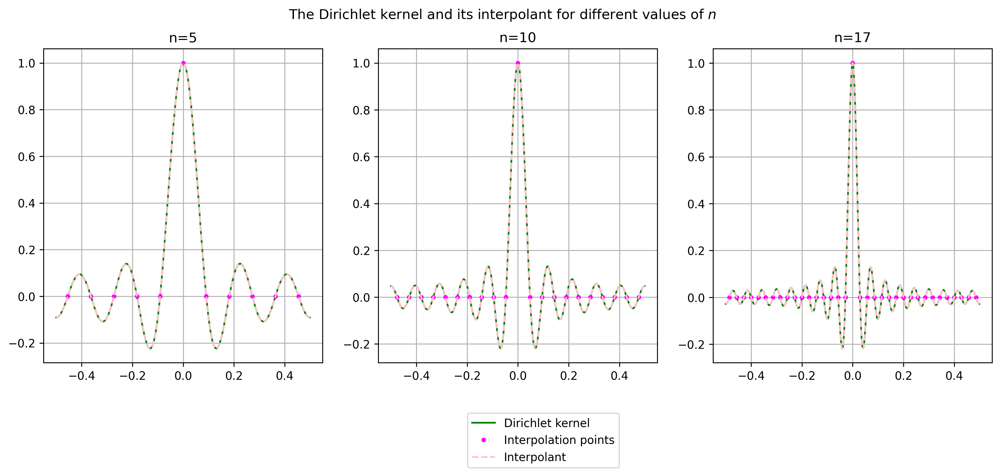

In [52]:
def dirichlet_kernel(x, n):
    """
    Input:
        n - The kernel's subscript/degree/index
        x - Points at which the function is to be evaluated
    Output:
        vals - Function value in the point (or points) x, of the function D_n(x) as previously defined in the project
    """
    
    numerator = np.sin((n+1/2)*2*np.pi*x)
    denominator = (2*n+1)*np.sin(np.pi*x)
    vals = np.divide(numerator, denominator, out = np.ones_like(numerator), where = denominator!=0)

    return vals

#print(dirichlet_kernel(0))

N=1000
interval_start = -0.5
ns = [5, 10, 17]
global n 
fig, axs = plt.subplots(1,3, figsize = (15, 5))
num_of_Ns = len(ns)

fig.suptitle(r"The Dirichlet kernel and its interpolant for different values of $n$") 

labels = ["Dirichlet kernel", "Interpolation points", "Interpolant"]

for count in range(len(ns)):
    axs[count].grid()
    #Dirichlet kernel
    n = ns[count]
    x, f = transform(dirichlet_kernel, N, interval_start, n)
    axs[count].set_title(f"n={n}")
    axs[count].plot(x, np.real(f), color="green")

    #Fundamental interpolant
    k = np.arange(-n, n+1, 1)
    interpolant = dirichlet_kernel(k/(2*n+1), n)
    axs[count].plot(k/(2*n+1), interpolant, "." ,color="magenta")

    #Fundamental interpolant
    ckf = np.full(2*n+1, 1/(2*n+1))
    a = interpolate(sc.fft.ifftshift(interpolant), ckf)
    g_vals = g(x,a,dirichlet_kernel,n)
    axs[count].plot(x, g_vals,'--' ,color="pink")
    
fig.legend(labels, bbox_to_anchor = [0.6, 0])
fig.show()

### b) Modified Dirichlet kernel

We now want to look at the interpolant in the space $V_{2n, D_n}$, which we will call $D_n^*$, or "the modified Dirichlet kernel".

We can then write 

$$
D_n^*(x) = \sum_{j=0}^{2n-1} a_j \tau_{2n}^j (D_n(x)) 
$$

For this to be our fundamental interpolant, we have to require that 

$$
D_n^*\left(\frac{p}{2n}\right) =
\begin{cases}
1 \qquad & p=0\\
0 \qquad & p=1, \ldots, 2n-1
\end{cases}
$$


Using results from 2g), we can find the fourier coefficients of $D_n^*$ such that it interpolates the $2n$ points $s=\{1,0,\ldots, 0\}$:

$$
c_k(g)=  \hat{s}_h  \frac{c_k(D_n)}{\widehat{(D_n)}_k}
$$

We note first that we already know

$$
c_k(D_n) =
\begin{cases}
\frac{1}{2n+1} \qquad & k = -n, \ldots, n \\[6pt]
0 \qquad & \text{else}
\end{cases}
$$

We then compute the DFTs of $\widehat{(D_n)}$ (using the aliasing formula) and $s$:

$$
\hat{s_h} = \frac{1}{2n}\sum_{j=0}^{2n-1}s_j e^{-2\pi i j h/(2n)} = \frac{1}{2n}, \quad h = 0, \ldots 2n-1
$$

$$
\widehat{(D_n)}_k = \sum_{l \in \mathbb{Z}} c_{k+2ln}(D_n) =
\begin{cases}
\frac{1}{2n+1} \qquad & k = -n+1, \ldots, n-1\\[6pt]
\frac{2}{2n+1} \qquad & k = \pm n
\end{cases}
$$

We then get

$$
c_k(g) = \hat{s}_h  \frac{c_k(D_n)}{\widehat{(D_n)}_k} =
\begin{cases}
\frac{1}{2n}, \qquad & k = -n+1, \ldots, n-1 \\[6pt]
\frac{1}{4n}, \qquad & k = \pm n 
\end{cases}
$$

We can then write the modified Dirichlet kernel as

$$
D_n^*(x) = \frac{1}{2n} \left( \sum_{k=-(n-1)}^{n-1}e^{2\pi i k x} + \frac{1}{2}(e^{2\pi i n x} + e^{-2\pi i n x}) \right)
$$


In order to work with this more efficiently numerically, we want to implement this in closed form. We can do this by using the identities

$$
\sum_{k=-u}^u e^{2\pi i k x} = 
\begin{cases}
1 \qquad & x \in \mathbb{Z} \\[6pt]
\frac{\sin(2\pi(u+1/2) x)}{\sin(\pi x)} \qquad & \text{else} 
\end{cases}
$$

and 

$$
\cos(2 \pi n x) = \frac{1}{2} (e^{2\pi i n x}+e^{-2\pi i n x})
$$

We then get

$$
\underline{D_n^*(x)} =
\begin{cases}
1 \qquad & x \in \mathbb{Z} \\[6pt]
\frac{\sin(2\pi(n-1/2) x)+\cos(2\pi n x)\sin(\pi x)}{2n \sin(\pi x)} \qquad & \text{else} 
\end{cases}
$$


Below we implement this closed form expression and plot its interpolant.

In [9]:
def mod_dirichlet_kernel(x, n):
    """
    Input:
        n - The kernel's subscript/degree/index
        x - Points at which the function is to be evaluated
    Output:
        vals - Function value in the point (or points) x, of the function D_n(x) as previously defined in the project
    """

    numerator = np.sin(2*np.pi*(n-1/2)*x)+np.cos(2*np.pi*n*x)*np.sin(np.pi*x)
    denominator = 2*n*np.sin(np.pi*x)
    vals = np.divide(numerator, denominator, out = np.ones_like(numerator), where = denominator!=0)

    return vals

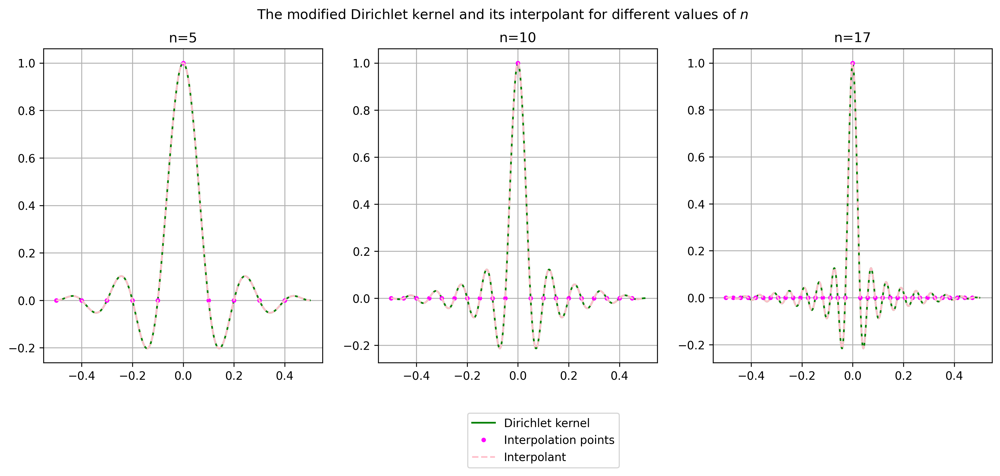

In [54]:
N=1000
interval_start = -0.5
ns = [5, 10, 17]

fig, axs = plt.subplots(1,3, figsize = (15, 5))
num_of_Ns = len(ns)
fig.suptitle(r"The modified Dirichlet kernel and its interpolant for different values of $n$") 
labels = ["Dirichlet kernel", "Interpolation points", "Interpolant"]
for count in range(len(ns)):
    axs[count].grid()
    #Dirichlet kernel
    n = ns[count]
    x, f = transform(mod_dirichlet_kernel, N, interval_start, n)
    axs[count].set_title(f"n={n}")
    axs[count].plot(x, np.real(f), color="green")

    #Zeros and one
    k = np.arange(-n, n, 1)
    interpolant = mod_dirichlet_kernel(k/(2*n), n)
    axs[count].plot(k/(2*n), interpolant, "." ,color="magenta")

    #Interpolant
    ckf = np.full(2*n + 1, 1/(2*n))
    ckf[0], ckf[-1] = 1/(4*n), 1/(4*n)
    a = interpolate(sc.fft.ifftshift(interpolant), ckf)
    g_vals = g(x,a,mod_dirichlet_kernel, n)
    axs[count].plot(x, g_vals, '--', color="pink")
fig.legend(labels, bbox_to_anchor = [0.6, 0])
fig.show()

Compared to the plots of the Dirichet kernel, we notice that the modified Dirichlet kernel quickly stabilizes around lower absolute values. This is prevalent for all the chosen $N$ values, but it is espesially easy to see that $N=17$ quickly tends to almost $0$. Now we want to use the modified Dirichlet kernel in order to provide high resolution signals, from signals we were given. This is done, and the signals are presented, in the block below.

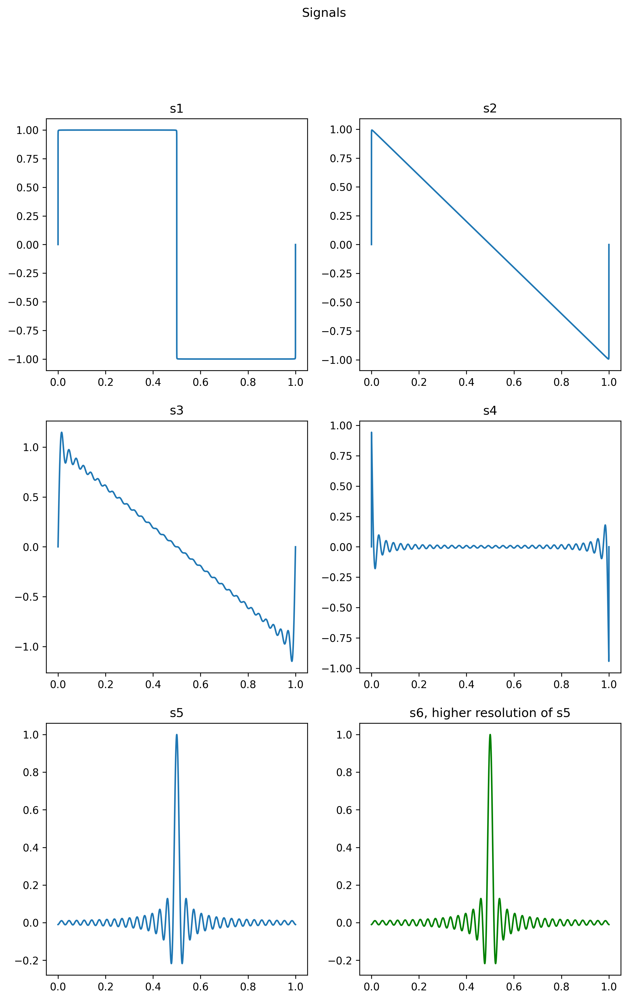

In [11]:
x, s1, s2, s3, s4, s5= np.loadtxt("project2-data/signals.csv", delimiter = ",", skiprows = 1, unpack = True, dtype = np.float64)
S = np.array([s1, s2, s3, s4, s5])
names = ["s1", "s2", "s3", "s4", "s5"]
n = round(len(S[0])/2)

x = np.linspace(0, 1, 2*n, endpoint=False)

fig, axs = plt.subplots(3,2, figsize = (10, 15))
fig.suptitle("Signals")
for j in range(len(S)):
    axs[j//2,j%2].set_title(names[j])
    axs[j//2,j%2].plot(x, S[j])

x2 = np.linspace(0, 1, (2*n)*4, endpoint=False)

ckf =  np.full(2*n+1, 1/(2*n))
ckf[0], ckf[-1] = 1/(4*n), 1/(4*n)

a = interpolate(S[-1], ckf)
g_vals = g(x2, a, mod_dirichlet_kernel, n)

axs[-1,-1].set_title("s6, higher resolution of s5")
axs[-1,-1].plot(x2, g_vals, color = "green")
fig.show()

Below we check if the signal is actually interpolated, and zoom into the signal in order to visually determine if there are indeeed three more points. 

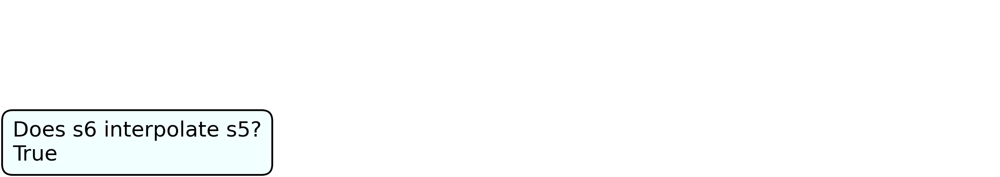

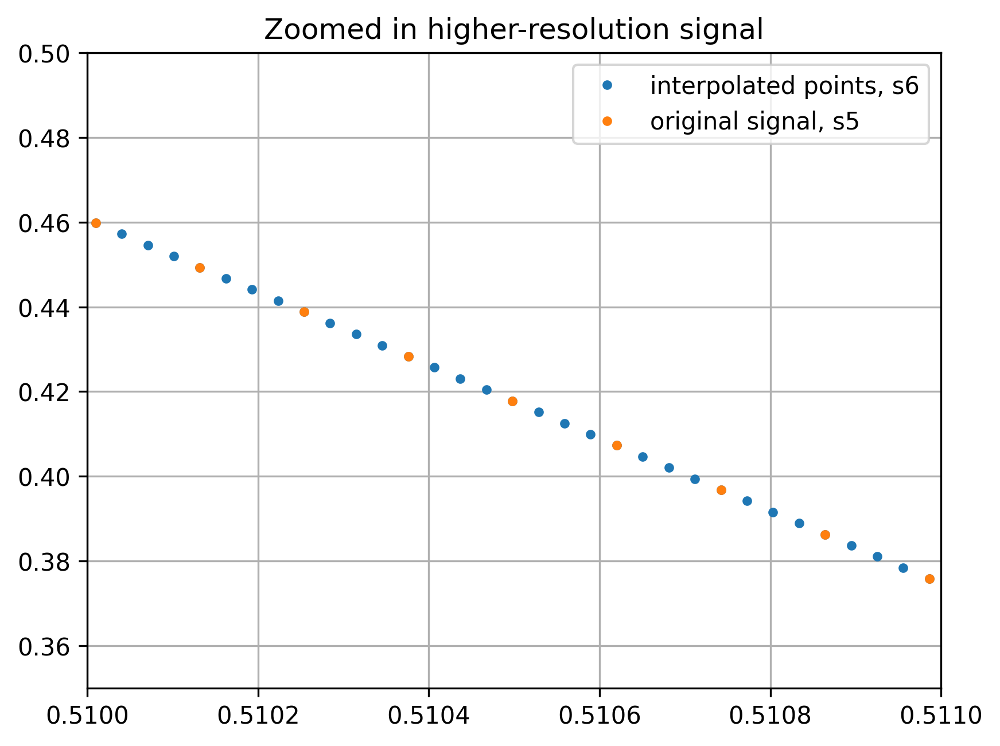

In [12]:
plt.figure(figsize=(8,1.5))
plt.text(0, 0, "Does s6 interpolate s5?\n" + str(np.allclose(S[-1],g_vals[::4], atol = 1e-16)), size=12, bbox=dict(boxstyle="round, pad=0.5",fc=(0.95, 1, 1)))
plt.axis("off")
plt.tight_layout()
plt.show()

plt.figure()
plt.title("Zoomed in higher-resolution signal")
plt.plot(x2, g_vals, '.', label = "interpolated points, s6")
plt.plot(x, S[4], '.', label = "original signal, s5")
plt.ylim(0.35, 0.5)
plt.xlim(0.51,0.511)
plt.legend()
plt.grid()
plt.show()

From the plot above we clearly see that there are three new points between every original value, and it is also evident that they are pretty much linear between the original values.

### c) Splitting the Space 

For even $n$, we can write $n = 2l, \quad l \in \mathbb{N}$. We then want to show that $D_l \in V_{4l, D_{2l}}$. These functions can be written as

$$
D_l = \frac{1}{2l + 1} \sum_{k=-l}^l e^{2\pi i k x}, \quad D_{2l} = \frac{1}{4l + 1} \sum_{k=-2l}^{2l} e^{2\pi i k x}
$$

We then also know that 
$$
c_k(D_l) = 
\begin{cases}
\frac{1}{2l+1} \qquad & k = -l,\ldots, l \\
0 \qquad & \text{else}
\end{cases}
$$ 

$$
c_k(D_{2l}) = 
\begin{cases}
\frac{1}{4l+1} \qquad & k = -2l,\ldots, 2l \\
0 \qquad & \text{else}
\end{cases}
$$ 


From earlier, we know that this is equivalent to showing that 
$$
c_k(D_l) = 4l \hat{a}_h c_k(D_{2l})
$$

Solving for $\hat{a}_h$ then yields

$$

$$

$$
\hat{a}_h = 
\begin{cases}
\frac{4l +1}{4l (2l+1)} \qquad & h = 0, \ldots, l \\
0 \qquad & h = l+1, \ldots, 3l-1  \\
\frac{4l +1}{4l (2l+1)} \qquad & h = 3l, \ldots, 4l-1 \\
\end{cases}
$$

Now we can use the inverse discrete Fourier transform, so that 
$$
a_h = \sum_{j = 0}^{4l-1} \hat{a}_j e^{2\pi i j h/(4l)} 
= \frac{4l +1}{2l+1} \left( \frac{1}{4l} \sum_{j = 0}^{l} e^{2\pi i j h/(4l)}
+ \frac{1}{4l} \sum_{j = 3l}^{4l-1} e^{2\pi i j h/(4l)} \right)
$$
$$
a_h = 
\begin{cases}
\frac{4l + 1}{4l} \qquad & h=0\\
\frac{4l+1}{(2l +1)4l} \sum_{j=-l}^{l}e^{2 \pi i j h/(4l)} , \qquad & \text{else}
\end{cases}
$$

$$
a_h =
\begin{cases}
\frac{4l + 1}{4l} \qquad & h=0\\[6pt]
\frac{4l+1}{(2l +1) 4l}
\frac{\sin(2\pi(l+1/2) h/(4l))}{\sin(\pi h / (4l))} \qquad & h=1,\ldots, 4l-1
\end{cases}
$$

substituting back $n = 2l$

$$
a_h =
\begin{cases}
\frac{2n + 1}{2n} \qquad & h=0\\[6pt]
\frac{2n+1}{(n +1) 2n}
\frac{\sin(2\pi((n+1)/2) h/(2n))}{ \sin(\pi h / (2n))} \qquad & h=1,\ldots, 2n-1
\end{cases}
$$

Hence we can conclude that $V_{n, D_{n/2}} \subset V_{n, D_n}$.

Below, we have checked numerically that $D_{\frac{n}{2}}=\sum_{j=0}^{2n-1}a_jf(x-\frac{j}{2n})$

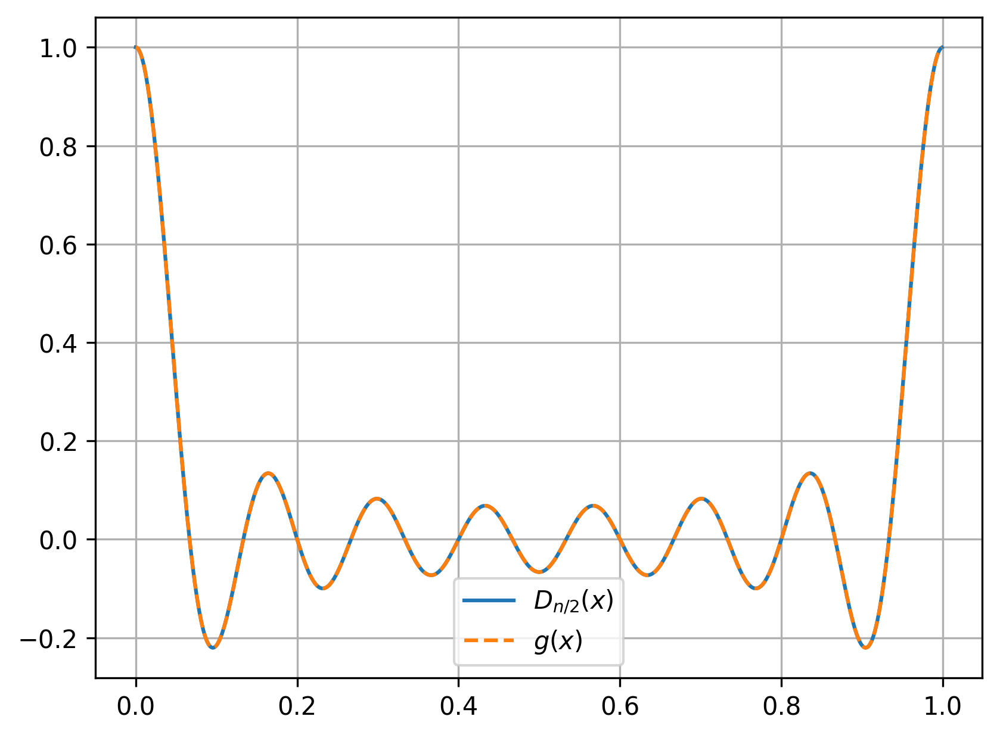

Are they equal? True


In [13]:
n = 14 #needs to be divisible by 2

a = np.zeros(2*n)
a[0] = (2*n+1)/(2*n)
for h in range(1, 2*n):
    a[h] = (2*n+1)/((n+1)*2*n) * np.sin(2*np.pi*((n+1)/2)*h/(2*n))/(np.sin(np.pi*h/(2*n)))

x = np.linspace(0, 1, 1000, endpoint=False)

D_n_2 = dirichlet_kernel(x, n/2)
g_vals = g(x, a, dirichlet_kernel, n)

plt.figure()
plt.plot(x, D_n_2, label = r"$D_{n/2}(x)$")
plt.plot(x, g_vals,'--' ,label = r"$g(x)$")
plt.legend()
plt.grid()
plt.show()

print("Are they equal?", np.allclose(D_n_2, g_vals, atol = 1e-14))

### d) Decomposition and Linear Independence of Translates

Now we want to find a subspace, $W_{n, E_\frac{n}{2}} \subset V_{2n, D_n}$ that is orthogonal to another subspace of $V_{2n, D_{n}}$, namely the subspace $V_{n, D_{\frac{n}{2}}}$. Now we are given a function $E_{\frac{n}{2}}$ by its Fourier coefficients 
$$
c_{h+ 2nz}(E_{\frac{n}{2}}) = 2n \hat{b_h} c_{h+2nz}(D_n), \quad \hat{b_h} = \hat{a}_{(h+n) \text{mod} 2n} e^{-h \pi i/n}
$$
This means that we can write the function $E_\frac{n}{2}$ as
$$
E_{\frac{n}{2}} = \sum_{l \in \mathbb{Z}}c_l(E_{\frac{n}{2}}) e^{2 \pi ilx} = 2n \sum_{l \in \mathbb{Z}} \hat{b}_l c_l(D_n) e^{2 \pi ilx} = 2n \sum_{l \in \mathbb{Z}}  e^{-l\pi i /n} e^{2 \pi ilx} \hat{a}_{(l+n) \text{mod} 2n} c_l(D_n)
$$
$$
E_{\frac{n}{2}} = \frac{2n}{2n+1} \sum_{l=-n}^n d_l e^{2 \pi ilx}, \qquad d_l = \hat{a}_{(l+n) \text{mod} 2n} e^{-2l\pi i /(2n)}
$$
Now, in order to later show that each $f$ and $g$ in these subspaces are orthogonal to each other, we first consider the inner product of the "bases" for the spaces, namely $E_{\frac{n}{2}}$ and $D_{\frac{n}{2}}$.
$$
\langle E_{\frac{n}{2}}, D_{\frac{n}{2}} \rangle = \frac{2n}{2n+1} \sum_{l=-n}^n \sum_{k=-n/2}^{n/2} d_l  \langle e^{2 \pi ilx}, e^{2 \pi ikx} \rangle
$$
We have made use of our evaluation of this last inner product numerous times, and know that it is only non-zero if $l=k$, meaning that we can write our inner product as 
$$
\langle E_{\frac{n}{2}}, D_{\frac{n}{2}} \rangle = \frac{2n}{2n+1}\sum_{l=-n/2}^{n/2}d_l
$$
Now if we consider our previous expression for $\hat{a_h}$, we recall that it was 
$$
\hat{a_h} = \begin{cases}
c, \quad 0, \ldots, \frac{n}{2} \\
0, \quad \frac{n}{2}-1, \ldots, 3\frac{n}{2}-1 \\
c \quad 3\frac{n}{2}, \ldots, 4\frac{n}{2}-1
\end{cases} \quad \text{with}
\quad c = \frac{2n+1}{2n(n+1)}
$$
Which means that for our $l\in [-\frac{n}{2}, \frac{n}{2}]$, we get that 
$$
\hat{a_l} = \begin{cases}
c, \quad l=\pm\frac{n}{2} \\
0, \quad \text{else}
\end{cases}
$$
Meaning that the inner product simplifies to 
$$
\langle E_{\frac{n}{2}}, D_{\frac{n}{2}} \rangle = \frac{2n}{2n+1}(e^{-2\pi i/4}+e^{2\pi i /4}) = 0
$$

We now want to show that we even have 
$$
\langle f, g\rangle =0, \qquad f \in V_{n, D_{\frac{n}{2}}}, \quad g \in W_{n, E_{\frac{n}{2}}}
$$

Here we will use Parseval's identity, which states that 

$$
\langle f, g\rangle = \sum_{k \in \mathbb{Z}} c_k(f) \overline{c_k(g)}
$$

We can then write 

$$
c_k(f) = \sum_{j=0}^n a_j e^{-2\pi i k j /n} c_k(D_{\frac{n}{2}})
$$

$$
c_k(g) = \sum_{l=0}^n b_l e^{-2\pi i k l /n} c_k(E_{\frac{n}{2}})
$$

We have 
$$
c_k(D_{\frac{n}{2}}) =
\begin{cases}
\frac{1}{n+1} \qquad & k=-\frac{n}{2}, \ldots, \frac{n}{2}\\[6pt]
0 \qquad & \text{else}
\end{cases}
$$

so we only need to look at 

$$
c_k(E_{\frac{n}{2}}) = 2n \hat{a}_{(k+n) \text{mod} 2n} e^{-k\pi i /n} c_k(D_n), \quad k=-\frac{n}{2}, \ldots, \frac{n}{2} 
$$

with 

$$
\hat{a}_{(k+n) \text{mod} 2n} =
\begin{cases}
\frac{2n+1}{2n(n+1)} \qquad & k = \pm \frac{n}{2} \\[6pt]
0 \qquad & k = -\frac{n}{2}+1, \ldots, \frac{n}{2}-1
\end{cases}
\qquad 
c_k(D_n) = \frac{1}{2n+1}, \quad k = -\frac{n}{2}, \ldots, \frac{n}{2}
$$

multiplying together, we then have

$$
c_k(E_{\frac{n}{2}}) = \frac{1}{n+1} e^{-k\pi i /n} \quad k = \pm \frac{n}{2}, \qquad \qquad c_k(E_{\frac{n}{2}}) = 0 \quad k = - \frac{n}{2}+1, \ldots, \frac{n}{2}-1
$$

Plugging this back into $\langle f, g \rangle$

$$
\begin{aligned}
\langle f, g \rangle 
&= \frac{1}{(n+1)^2} \sum_{j=0}^n a_j \sum_{l=0}^n b_l \sum_{k \in \mathbb{Z}} e^{-2\pi i k j /n} e^{2\pi i k l /n} e^{k\pi i /n}\\
&= 
\frac{1}{(n+1)^2} \sum_{j=0}^n a_j \sum_{l=0}^n b_l \sum_{k \in \mathbb{Z}} e^{\pi i k (2(l-j)+1)/n}\\
&=
\frac{1}{(n+1)^2} \sum_{j=0}^n a_j \sum_{l=0}^n b_l (e^{\pi i (2(l-j)+1)/2}+e^{-\pi i (2(l-j)+1)/2})\\
&=
\frac{1}{(n+1)^2} \sum_{j=0}^n a_j \sum_{l=0}^n b_l 2 \cos\left(\frac{\pi}{2} (2(l-j)+1)\right) 
\end{aligned}
$$
We see that 
$$
\cos\left(\frac{\pi}{2} (2(l-j)+1)\right) = 0 \quad \forall l, j \in \mathbb{Z}
$$

since $2(l-j)+1$ is always an odd number

so we must have

$$
\langle f, g \rangle = 0 \qquad \qquad \square
$$

We have also tried to find a closed form expression for the function $E_{n/2}$

$$
\hat{a}_{(k+n)\text{mod} 2n} = 
\begin{cases}
0 \qquad & k \in \left(-\frac{n}{2}, \frac{n}{2} \right)  \\[6pt]
\frac{2n+1}{2n(n+1)} \qquad & k \in \left[-n, -\frac{n}{2}\right] \cup \left[\frac{n}{2}, n\right]\\[6pt]
\end{cases}
$$

Then we have 

$$
c_k(E_{\frac{n}{2}}) = 
\begin{cases}
\frac{1}{n+1}e^{-\pi i k/n} \qquad & k \in \left[-n, -\frac{n}{2}\right] \cup \left[\frac{n}{2}, n\right]\\
0 \qquad & \text{else}
\end{cases}
$$

We can then write
$$
E_{\frac{n}{2}}(x)=\frac{1}{n+1}\left( \sum_{k=-n}^n e^{2\pi i k(x-\frac{1}{2n})} - \sum_{k=-(\frac{n}{2}-1)}^{\frac{n}{2}-1} e^{2\pi i k(x-\frac{1}{2n})} \right)
$$

or

$$
E_n(x)=\frac{1}{2n+1}\left( \sum_{k=-2n}^{2n} e^{2\pi i k(x-\frac{1}{4n})} - \sum_{k=-(n-1)}^{n-1} e^{2\pi i k(x-\frac{1}{4n})} \right)
$$

using trigonometric identities as before, we can write

$$
E_n(x) =
\frac{\sin(2\pi(2n+\frac{1}{2})(x-\frac{1}{4n})) - \sin(2\pi(n-1/2)(x-\frac{1}{4n}))}{(2n+1) \sin(\pi(x-\frac{1}{4n}))} 
$$

Below we plot this function as well, to check numerically that we have $E_{\frac{n}{2}} \in V_{2n, D_n}$

In [14]:
def E(x,n):
    """
    Analytic expression for E_n(x)
    input:
        x: array, x-values
        n: int, "degree" of E
    output:
        vals: array, function values
    """
    numerator = np.sin(2*np.pi*(2*n+1/2)*(x-1/(4*n))) - np.sin(np.pi*(2*n-1)*(x-1/(4*n)))
    denominator = (2*n+1)*np.sin(np.pi*(x-1/(4*n)))
    
    vals = np.divide(numerator, denominator, out = np.full_like(numerator, 2*(1+n)/(1+2*n)), where = denominator!=0)

    return vals

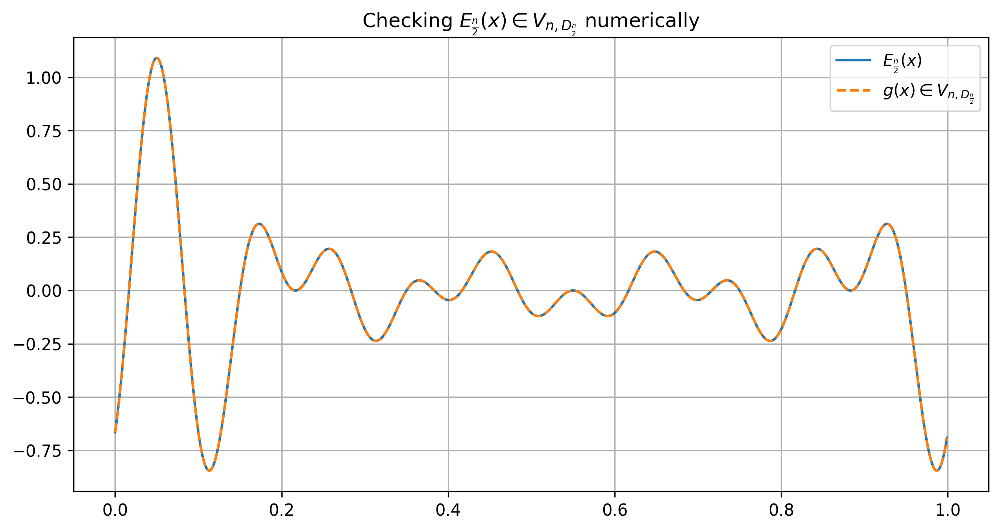

In [57]:
def b_coefficients(a):
    """
    Calculates b-coefficients such that E_{n/2} is in V_{n, D_{n/2}},
    given a-coefficients such that D_{n/2} is in V_{2n, D_{n}}
    input:
        a: array
    output:
        b: array
    """
    n = len(a)//2
    a_hat = sc.fft.fft(a, norm="forward")
    b_hat = np.zeros(2*n, dtype=complex)
    for h in range(2*n):
        b_hat[h] = a_hat[round((h+n)%(2*n))]*np.exp(-1j*h*np.pi/n)
    b = np.real(sc.fft.ifft(b_hat, norm="forward"))
    return b

n=10
a = np.zeros(2*n)
a[0] = (2*n+1)/(2*n)
for h in range(1, 2*n):
    a[h] = (2*n+1)/((n+1)*2*n) * np.sin(2*np.pi*((n+1)/2)*h/(2*n))/(np.sin(np.pi*h/(2*n)))

b = b_coefficients(a)
x = np.linspace(0,1,1000, endpoint=False)


g_vals = g(x, b, dirichlet_kernel, n)

plt.figure(figsize=(10,5))
plt.title(r"Checking $E_{\frac{n}{2}}(x) \in V_{n, D_{\frac{n}{2}}}$ numerically")
plt.plot(x, E(x,round(n/2)), label = r"$E_{\frac{n}{2}}(x)$")
plt.plot(x, g_vals,'--' ,label = r"$g(x) \in V_{n, D_{\frac{n}{2}}}$")
plt.legend()
plt.grid()
plt.show()

From the plot above, it seems like we have confirmed numerically that $E_\frac{n}{2}(x) \in V_{n, D_\frac{n}{2}}$

To check if the translates of $E_{\frac{n}{2}}$ are orthonormal, we can check our condition from 2d):

$$
g_0 = \sum_{z \in \mathbb{Z}}|c_z(f)|^2=1
$$
$$
g_k = \sum_{z \in \mathbb{Z}}e^{-2\pi izk/N}|c_z(f)|^2 = 0, \qquad k = 1,\ldots, N-1
$$

We start by checking the first one:
$$
\sum_{z \in \mathbb{Z}}|c_z(f)|^2 = \frac{n+2}{(n+1)^2} \neq 1
$$

We see that this is not correct, so we either have the wrong Fourier coefficients for $E_\frac{n}{2}$, and/or our statement about orthonormality of the translates from 2d) is wrong. We were not able to see what was wrong, but we should have had 

$$
g_k =
\begin{cases}
1 \qquad & k=0\\
0 \qquad & k=1, \ldots, n-1
\end{cases}
$$

### e) Decomposing signals

We now wish to decompose the signals presented earlier in the spaces 
$$
V_{2n,D_n}, V_{n,D_\frac{n}{2}},V_{\frac{n}{2},D_\frac{n}{4}},V_{\frac{n}{4},D_\frac{n}{8}}
$$
and
$$
W_{n,E_\frac{n}{2}},W_{\frac{n}{2},E_\frac{n}{4}},W_{\frac{n}{4},E_\frac{n}{8}}
$$

with $n=512$ and a signal with $2n$ values on the interval $[0,1)$. The concept is to split a space $V$ into two orthogonal subspaces with equal dimension, so $V_{2n,D_n}$ can be divided into $V_{n,D_\frac{n}{2}}$ and $W_{n,E_\frac{n}{2}}$, both with dimension $n$. Since both subspaces are orthogonal, and each with dimension $n$, we know that 
$$
V_{2n, D_n} = V_{n, D_\frac{n}{2}} \oplus W_{n,E_\frac{n}{2}}
$$
This means that instead of projecting a signal into $W_{n,E_\frac{n}{2}}$ by interpolation, we could instead project it into $V_{2n, D_n}$ and $V_{n, D_\frac{n}{2}}$ by interpolation, and then take the difference to get the signals decomposition into the first space. A function to do this is implemented in the block below.

In [58]:
def decompose_signal(signal, J):
    """
    Decomposes a signal into J wavelet spaces and 1 scale space.
    The signal is reconstructed by adding the decomposed signals back together.
    input:
        signal: (2n) array, values we want to decompose
        J:      int, the number of wavelet decompositions
    output:
        x:                    (2n) array, x values on [0,1) corresponding to signal values
        signal_decomposition: (2n,J+1) array, the first J columns are functions in the 
                              wavelet spaces, and the last column is in the scale space
    """
    n = round(len(signal)/2)
    x = np.linspace(0,1, 2*n, endpoint=False)

    ckD = np.full(2*n + 1, 1/(2*n)) #Fourier coefficients for the modified Dirichlet kernel
    ckD[0], ckD[-1] = 1/(4*n), 1/(4*n)
    a = interpolate(signal, ckD)
    g_V_full = g(x, a, dirichlet_kernel, n)

    signal_decomposition = np.zeros((len(x),J+1))

    for j in range(1, J+1):
        N = round(n/2**j)

        ckD = np.full(2*N + 1, 1/(2*N)) #Fourier coefficients for the modified Dirichlet kernel
        ckD[0], ckD[-1] = 1/(4*N), 1/(4*N)
        a = interpolate(signal[::2**j], ckD)
        g_V_half = g(x, a, dirichlet_kernel, N)

        g_W_half = g_V_full - g_V_half

        signal_decomposition[:,j-1] = g_W_half

        g_V_full = g_V_half
    signal_decomposition[:,-1] = g_V_half

    return x, signal_decomposition

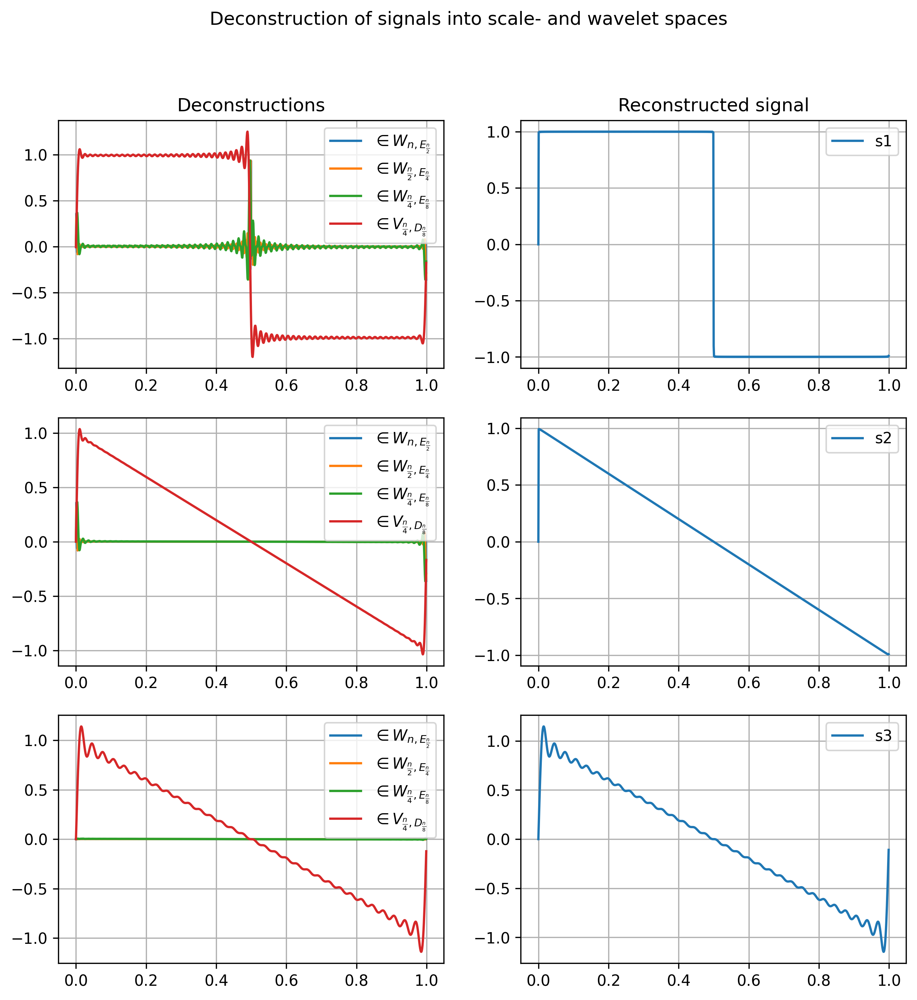

In [59]:
n = 512
J = 3
fig, axs = plt.subplots(3, 2, figsize=(10,10))
fig.suptitle("Deconstruction of signals into scale- and wavelet spaces")
axs[0,0].set_title("Deconstructions")
axs[0,1].set_title("Reconstructed signal")
for i in range(3):
    x, decomp_sig = decompose_signal(S[i][::round(len(S[i])/(2*n))], J)
    axs[i,0].plot(x, decomp_sig)
    if J==3:
        axs[i,0].legend([r'$\in W_{n, E_\frac{n}{2}}$',r'$\in W_{\frac{n}{2}, E_\frac{n}{4}}$',r'$\in W_{\frac{n}{4}, E_\frac{n}{8}}$',r'$\in V_{\frac{n}{4}, D_\frac{n}{8}}$'])
    axs[i,0].grid()

    axs[i,1].plot(x, np.sum(decomp_sig, axis=1), label=f"s{i+1}")
    axs[i,1].legend()
    axs[i,1].grid()
fig.show()

From the plots above, it is clear that the decomposition into the space $V_{\frac{n}{4}, D_\frac{n}{8}}$ carries the most information, even though the dimension of the space is $1/8$-th of the dimension of the signal in $V_{2n, D_n}$. To reconstuct our original signal we would need the spaces we have plotted above, namely $W_{n, E_\frac{n}{2}}$ $W_{\frac{n}{2}, E_\frac{n}{4}}$, $W_{\frac{n}{4}, E_\frac{n}{8}}$ and $V_{\frac{n}{4}, D_\frac{n}{8}}$. Worth noting that the higher frequencies will be stored in the spaces with higher dimension while the lower frequencies are in the smaller spaces.

## Task 4 - Periodic Wavelets and Image Decomposition

Now that we have learned a more about the Fourier transform, we are ready to look at one possible application of it. We will be using it to look into image decomposition, and also denoising of dithered images.

### a) - Separation of Magnitude and Phases in Images 
Firstly we want to use this transform to do something cool with the images "barbara.gif" and "klaus.gif". In the block of code below we apply a 2D discrete Fourier transform, and exchange the images's phases. This might lead to some insight as to which components are the most "important" for an image: its phase or its amplitude. In order to determine these quantities we can make use of the fact that the transformed values are complex, meaning that each entry $\hat{F_k} = |\hat{F_k}|e^{i\phi_k}$. 

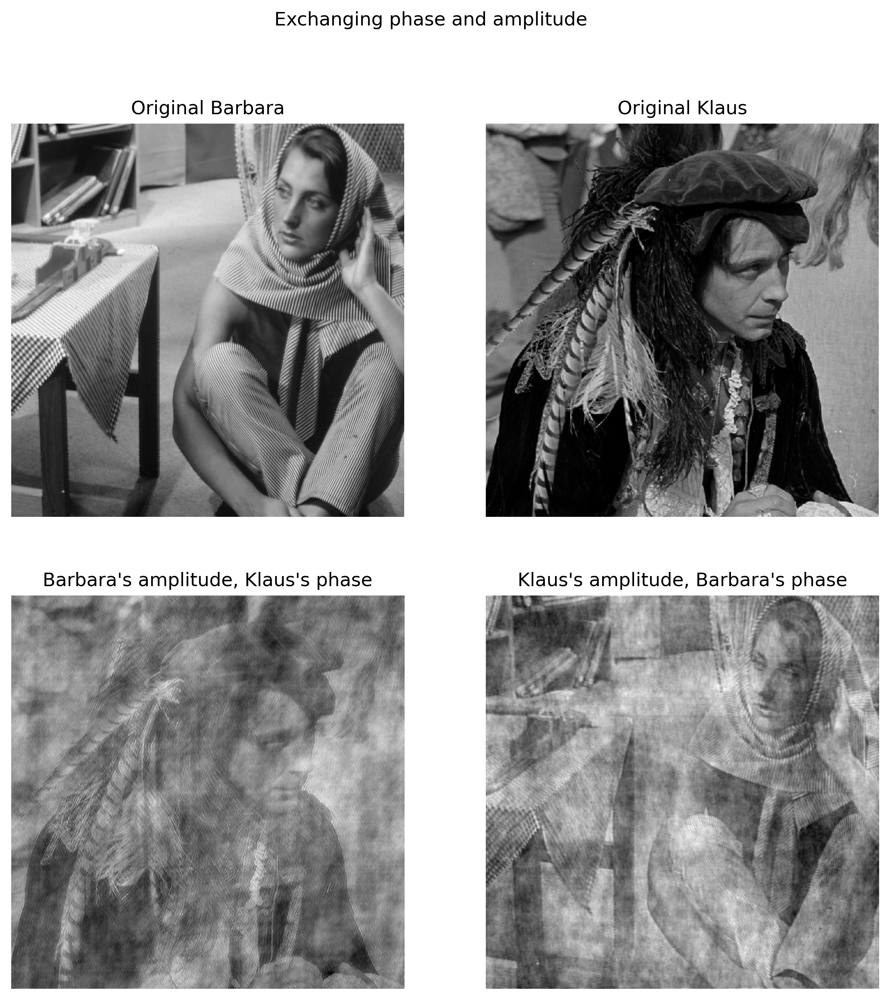

In [18]:
#Loading of pictures
barbara = plt.imread("project2-data/barbara.gif")
klaus = plt.imread("project2-data/klaus.gif")

#Applying 2D-FFT to the Barbara-image, and separating magnitudes and phases
barbara_transformed = sc.fft.fft2(barbara, norm = "forward")
amp_barbara = np.abs(barbara_transformed)
phase_barbara = np.angle(barbara_transformed)

#Applying 2D-FFT to the Klaus-image, and separating magnitudes and phases
klaus_transformed = sc.fft.fft2(klaus, norm = "forward")
amp_klaus = np.abs(klaus_transformed)
phase_klaus = np.angle(klaus_transformed)

#Combining the two into new images, with exchanged phases
exchanged1 = np.multiply(amp_barbara, np.exp(1j*phase_klaus ))
exchanged2 = np.multiply(amp_klaus, np.exp(1j*phase_barbara ))

#Applying the inverse 2D-FFT 
reconstruction1 = np.real(sc.fft.ifft2(exchanged1, norm="forward"))
reconstruction2 = np.real(sc.fft.ifft2(exchanged2, norm="forward"))

fig, axs = plt.subplots(2,2, figsize=(10,10))
fig.suptitle("Exchanging phase and amplitude")
axs[0,0].set_title("Original Barbara")
axs[0,0].imshow(np.real(barbara), cmap = "gray")
axs[0,0].axis("off")

axs[0,1].set_title("Original Klaus")
axs[0,1].imshow(klaus, cmap = "gray")
axs[0,1].axis("off")

axs[1,0].set_title("Barbara's amplitude, Klaus's phase")
axs[1,0].imshow(reconstruction1, cmap = "gray")
axs[1,0].axis("off")

axs[1,1].set_title("Klaus's amplitude, Barbara's phase")
axs[1,1].imshow(reconstruction2, cmap = "gray")
axs[1,1].axis("off")

fig.show()

We see that we can still recognize Klaus in the picture that contains Klaus's phase; and Barbara in the picture that contains her phase. For these particular pictures, this seems to mean that the phase of the pictures contain more information about the pictures than the amplitudes. This makes sense, since the amplitudes simply tell us how "strong" the frequencies are. 

### b) Denoising images
One can also use the Fourier transform to denoise images. The idea here is to first compute the 2d FFT of the images, and then apply a filter that discards the noisy/dithered components. Noise, edge and texture are all high frequency components, but we only want to get rid of the noise (GitHub - Bharati2301). First we will look at the amplitude of a grayscale picture to get an idea of what the frequencies look like.

In [19]:
#Loading of images
yarimton_dithered = plt.imread("project2-data/Yarimton-dithered.png")
r, c = yarimton_dithered.shape[:2] #rows and columns of the picture
yarimton_dithered = np.reshape(yarimton_dithered[:,:,:1], (r, c)) #it is a grayscale image, so we only need one of the RGB values (they are equal)

munkholmen_dithered = plt.imread("project2-data/munkholmen-dithered.png") #only contains one channel, no need to reshape or remove channels
munkholmen_dithered = munkholmen_dithered/np.amax(munkholmen_dithered)

lighthouse_dithered = plt.imread("project2-data/lighthouse-dithered.png") #only contains one channel, no need to reshape or remove channels
lighthouse_dithered = lighthouse_dithered/np.amax(lighthouse_dithered)

#Collecting them in one list
images = [yarimton_dithered, munkholmen_dithered, lighthouse_dithered]

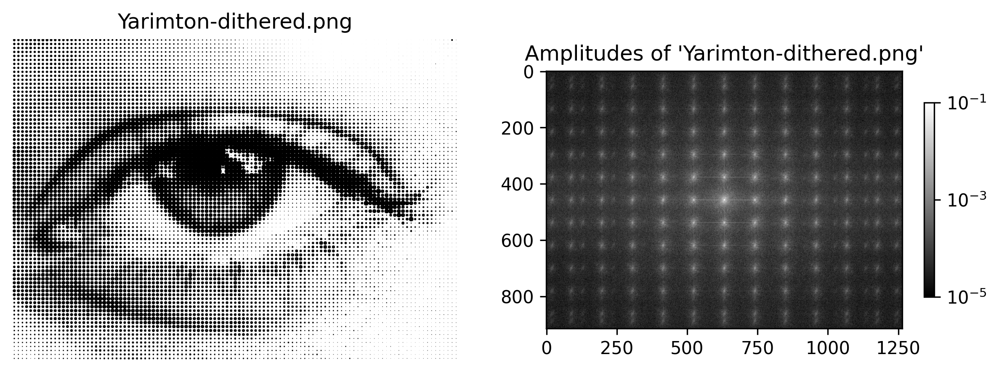

In [20]:
#Plotting the amplitude of yarimton-dithered.png
yarimton_fft2 = sc.fft.fft2(yarimton_dithered, norm = "forward")
yarimton_fft2 = sc.fft.fftshift(yarimton_fft2)
yarimton_amp = np.abs(yarimton_fft2)

fig, axs = plt.subplots(1, 2, figsize=(10,4))
axs[0].set_title('Yarimton-dithered.png')
axs[0].imshow(yarimton_dithered, cmap = "gray")
axs[0].axis("off")
axs[1].set_title("Amplitudes of 'Yarimton-dithered.png'")
axs1 = axs[1].imshow(yarimton_amp, norm=LogNorm(vmin=1e-5, vmax = 1e-1), cmap = "gray")
fig.colorbar(axs1, shrink=0.5)
fig.show()

We see that the highest amplitude are located right at the center (after applying the fftshift). We also see a pattern of bright dots, and that the amplitudes are lower towards the edges. We suspect that the dots-pattern might come from the dithering, and would like to remove these. We therefore initially want to implement a filter that keeps the values in the middle (the highest frequencies might contain important information about the contrast). This is known as a "low pass filter".

This seemed to work fine for the "yarimton" image presented above, but not as well for the others. Therefore we have instead implemented a circular filter below, with both an inner and outer radius, providing flexibility for the choice of which magnitudes to keep. Then one could for instance avoid including the highest amplitudes, while still only including a certain amount of other high amplitudes. This is known as a "band pass filter".

In our implementation of the filter, we have taken some inspiration from the following source:

GitHub - Bharati2301/Image-Denoising-using-Fast-Fourier-Transform. (2022). Retrieved 30 October 2022, from https://github.com/Bharati2301/Image-Denoising-using-Fast-Fourier-Transform

In [21]:
def make_filter(shape, r_inner, r_outer):
    """
    Makes a band pass filter, only keeping values in the center 
    between the concentric circles with radius r_inner and r_outer.
    The filter is later applied by simply multiplying it with the image. 
    input:
        shape:          tuple, shape of grayscale (2d) image
        r_inner:        float, radius of the inner circle
        r_outer:        float, radius of the outer circle
    output:
        mask:           array, shape given by the 'shape' argument
    """
    rows, cols = shape[0], shape[1]
    x0, y0 = int(rows/2), int(cols/2) 

    mask = np.zeros((rows, cols))
    
    y, x = np.meshgrid(np.arange(0, cols, 1), np.arange(0, rows, 1))

    mask_area = np.logical_and(((x-x0)**2 + (y-y0)**2 >= r_inner**2),
                               ((x-x0)**2 + (y-y0)**2 <= r_outer**2))

    mask[mask_area] = 1

    return mask

Having implemented the filter, we now implement a function in the block below to use our filter to remove dithering from images. 

In [22]:
def remove_dithering(im, mask):
    """
    Removes noise from a greyscale (2d) image
    input:
        im:             (r,c) array, image we want to denoise
        mask:           (r,c) array, contains 1s for the frequencies we want to keep and 0s elsewhere
    output:
        im_result       (r,c) array, denoised image
    """
    #calculates the 2d FFT of the image
    im_fft2 = sc.fft.fft2(im, norm = "forward")

    #applying the filter
    im_fft2 = sc.fft.fftshift(im_fft2)
    im_fft2 = im_fft2*mask
    im_fft2 = sc.fft.ifftshift(im_fft2)

    #calculates the 2d IFFT of the image
    im_result = np.real(sc.fft.ifft2(im_fft2, norm ="forward"))

    return im_result

Now we can use our method to actually remove the dithering from the images that were provided to us, and this is done in the block below.

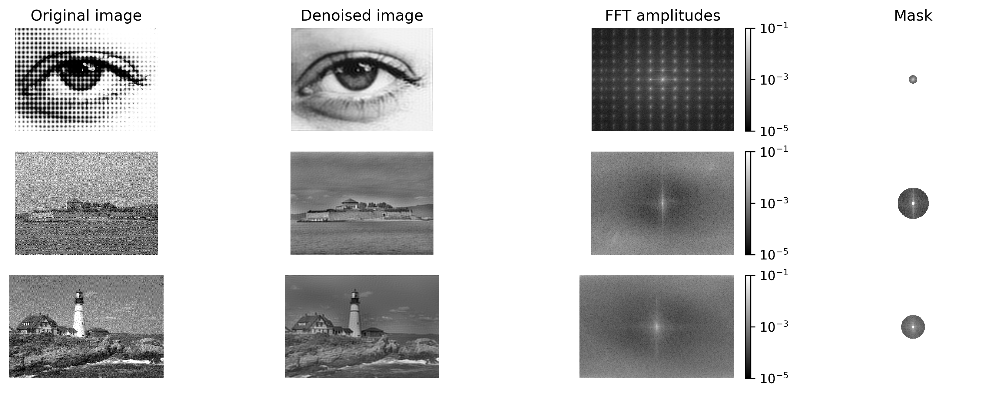

In [23]:
yarimton_mask = make_filter(yarimton_dithered.shape, 0, 40)
munkholmen_mask = make_filter(munkholmen_dithered.shape, 5, 60)
lighthouse_mask = make_filter(lighthouse_dithered.shape, 3, 60)

masks = [yarimton_mask, munkholmen_mask, lighthouse_mask]

fig, axs = plt.subplots(3, 4, figsize = (15,5) )
axs[0,0].set_title("Original image")
axs[0,1].set_title("Denoised image")
axs[0,2].set_title("FFT amplitudes")
axs[0,3].set_title("Mask")
for i in range(len(images)):
    image_noise_removed = remove_dithering(images[i], masks[i])
    amplitude = np.abs(sc.fft.fft2(images[i], norm = "forward"))
    amplitude = sc.fft.fftshift(amplitude)

    axs[i,0].imshow(images[i], cmap = "gray")
    axs[i,0].axis("off")

    axs[i,1].imshow(image_noise_removed, cmap = "gray")
    axs[i,1].axis("off")

    ax2 = axs[i,2].imshow(amplitude, cmap = "gray", norm=LogNorm(vmin=1e-5, vmax = 1e-1))
    axs[i,2].axis("off")

    masks[i][masks[i]==0] = np.nan #makes the mask plot nicer
    axs[i,3].imshow(amplitude*masks[i], cmap = "gray", norm=LogNorm(vmin=1e-5, vmax = 1e-1))
    axs[i,3].axis("off")
    fig.colorbar(ax2, fraction = 0.03)
fig.show()

Having experimented a bit with different radii for our filters, we were eventually able to get decent reconstructions. For the first image we see that few magnitudes are required compared to the other pictures. A reason for this might be that this image's magnitude seems  to differ from the other magnitudes, as it has one peek in the centre, where the magnitude rapidly decreases when you move away from this peek, whereas for the other images this change is more gradual, leading to an increased required amount of magnitudes included. 

The images are also clealry different when it comes to the noise, where the first picture consists of large dots, while the two other pictures have much finer noise. Denoising the two last pictures therefore proved more challenging than denoising the first with the dot-pattern.

### c) Generalizing the shift space to two dimensions

Instead of looking at the space $V_{N,f}$, we would now like to look at $V_{\textbf{N}, F}$, where $\textbf{N}=(N_1, N_2)^\top$ and $F : [0,1)^2\Rightarrow \mathbb{C}$

We will here take a tensor product approach, i.e. we use
$$
D_\textbf{N}(\textbf{x}) = D_{N_1}(x_1)D_{N_2}(x_2)
$$

We can then define an element in the space as

$$
g\in V_{2\textbf{N}, D_\textbf{N}} \iff \text{there exist } a_{j_1,j_2} \text{ such that } 
$$
$$
g(\textbf{x})= \sum_{j_1=0}^{2N_1-1} \sum_{j_2=0}^{2N_2-1} a_{j_1, j_2} D_{N_1}\left(x_1-\frac{j_1}{N_1}\right)  D_{N_2}\left(x_2-\frac{j_2}{N_2}\right)
$$
$$
=
\sum_{\textbf{j}=(0,0)}^{(2N_1-1,2N_2-1)} a_\textbf{j} D_\textbf{N}\left(\textbf{x}-\frac{\textbf{j}}{\textbf{N}}\right)
$$

### d) Wavelet Decomposition of Images

In the following blocks we have tried to implement a wavelet decomposition of our images in order to remove the dot artefacts in another way than what was done in 4b). To do this, we have tried to find the $a$ coefficients in each column of the image, and then finding the coefficients in each row.
We then use the sum defined about to hopefulle get a deconstruction of our image, using a tensor product approach. For our Fourier coefficients, we also use $c_\textbf{k}(D_\textbf{N}) = c_{k_1}(D_{N_1}) c_{k_2}(D_{N_2})$.

In [60]:
def dirichlet_kernel_2d(x,N):
    """
    Computes the Dirichlet kernel in 2d
    input:
        x: array, x1=x[0] (array) and x2=x[1] (array)
        N: array, N1=N[0] (int) and N2 = N[1] (int)
    output:
        D: (x.shape) array, values of Dirichlet kernel in 2d, using tensor product
    """
    D1 = dirichlet_kernel(x[0], N[0])
    D2 = dirichlet_kernel(x[1], N[1])
    D = np.tensordot(D1, D2, axes=0)
    return D

def ck_modified_dirichlet_2d(N):
    """
    Computes the Fourier coefficients for the modified Dirichlet kernel in 2d
    input:
        N: array, N1=N[0] (int) and N2 = N[1] (int)
    output:
        ckD: (2N1+1, 2N2+1) array, containing the Fourier coefficients for the modified Dirichlet kernel in 2d, using tensor product
    """
    N1, N2 = N[0], N[1]
    ckD1 = np.full(2*N1 + 1, 1/(2*N1)) 
    ckD1[0], ckD1[-1] = 1/(4*N1), 1/(4*N1)

    ckD2 = np.full(2*N2 + 1, 1/(2*N2))
    ckD2[0], ckD2[-1] = 1/(4*N2), 1/(4*N2)

    ckD = np.tensordot(ckD1, ckD2, axes=0)
    return ckD

In [61]:
def interpolate_2d(S, ckD):
    """
    Interpolates in 2d
    input:
        S: array, values we want to interpolate
        ckD: array, Fourier coefficients for the modified Drichlet kernel in 2d
    output:
        A: array, Coefficients in scale space
    """
    N1, N2 = S.shape[0], S.shape[1]
    A = np.zeros((N1, N2))
    for j2 in range(N2):
        A[:,j2] = interpolate(S[:,j2], ckD[:,j2])
    for j1 in range(N1):
        A[j1,:] = interpolate(A[j1,:], ckD[j1,:])
    return A

def g_2d(x, A, N):
    """
    Computes the 2d interpolation function, given its coefficients
    input:
        x: array, x1=x[0] (array) and x2=x[1] (array)
        A: array, Coefficients in scale space
        N: array, N1=N[0] (int) and N2 = N[1] (int)
    output:
        g_vals: array
    """
    j1 = np.arange(0, N[0]*2, 1)
    j2 = np.arange(0, N[1]*2, 1)

    J = np.array(np.meshgrid(j1, j2)).T.reshape(-1,2)

    g_vals = np.zeros((len(x[0]),len(x[1])))
    for j in J:
        g_vals += A[j[0],j[1]]*dirichlet_kernel_2d(x-j/(N*2), N)
    return g_vals

def decompose_image(image, J):
    """
    Decomposes 2d image into scale and wavelet space, with J wavelet levels
    input:
        image: array, grayscale image we want to decompose
        J: number of wavelet levels
    output:
        image_decomposition: (J+1, image.shape), contains the decompostions of the image into wavelet- and scale spaces
    """
    N = np.array([round(image.shape[0]/2), round(image.shape[1]/2)], dtype=np.int16)
    x = np.array([np.linspace(0,1, N[0]*2, endpoint=False), np.linspace(0,1, N[1]*2, endpoint=False)], dtype=object)

    ckD = ck_modified_dirichlet_2d(N)
    A = interpolate_2d(image, ckD)
    g_V_full = g_2d(x, A, N)

    image_decomposition = np.zeros((J+1, N[0]*2, N[1]*2))
    for j in range(1, J+1):
        n = np.array(N/2**j, dtype=np.int16)

        ckD = ck_modified_dirichlet_2d(n)
        A = interpolate_2d(image[::2**j,::2**j], ckD)
        g_V_half = g_2d(x, A, n)

        g_W_half = g_V_full - g_V_half

        image_decomposition[j-1] = g_W_half

        g_V_full = g_V_half
    image_decomposition[-1] = g_V_half

    return image_decomposition

In [ ]:
lighthouse_decomposed = decompose_image(images[2], 1)

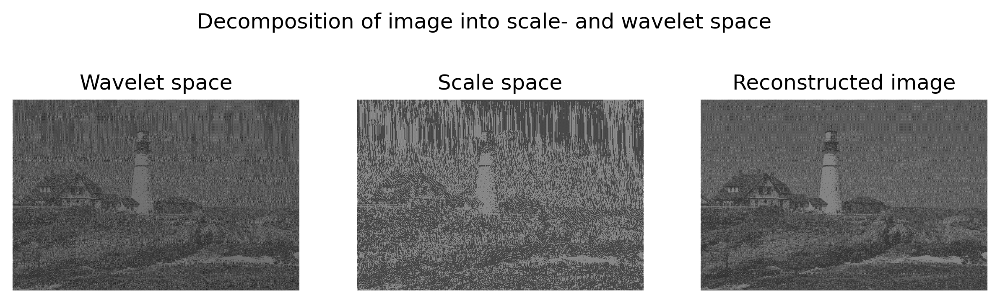

In [75]:
fig, axs = plt.subplots(1,3, figsize=(10,3))
fig.suptitle("Decomposition of image into scale- and wavelet space")

axs[0].set_title("Wavelet space")
axs[0].imshow(lighthouse_decomposed[0], cmap="gray")
axs[0].axis("off")

axs[1].set_title("Scale space")
axs[1].imshow(lighthouse_decomposed[1], cmap="gray")
axs[1].axis("off")

axs[-1].set_title("Reconstructed image")
axs[-1].imshow(np.sum(lighthouse_decomposed, axis = 0), cmap="gray")
axs[-1].axis("off")
fig.show()

From the plot above, we seem to be able to deconstruct- and reconstruct the image. However, not as intended. Our original plan was to discard the image from the wavelet space (as this should include the noise), and only keeping the image in the scale space.

Something "funny" one could do would then be to keep the image in the wavelet space. We also think this could be used for edge detection, however this clearly did not work in our example above.

## Conclusion

We have now explored several properties of the Fourier transform. In particular, we have examined the coefficients, and the properties which depends on them. To concretize, we have looked at spaces of translates, and used base functions like the Dirichlet kernel. A large part of this has also been interpolation and the fundamental interpolant, which was very useful for decomposing signals into spaces of lower dimension. However, this went somewhat less smoothly for the decomposition of the dithered images. 

#### Sources
GitHub - Bharati2301/Image-Denoising-using-Fast-Fourier-Transform. (2022). Retrieved 30 October 2022, from https://github.com/Bharati2301/Image-Denoising-using-Fast-Fourier-Transform

Sinha, A. (2018). Better Edge detection and Noise reduction in images using Fourier Transform. Retrieved 30 October 2022, from https://akshaysin.github.io/fourier_lpf.html#.Y15ognbMK5c

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=d2fd0b19-44b0-42bd-b2ce-3b443fe962d1' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>